# COVID Explortory Data Analysis (EDA)

In [2]:
import os
import cdsapi

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotnine as p9
import seaborn as sns

from utils import GetCOVID_Dataset
from utils import GetVariants
from utils import ClimateDataProcessor
from utils import GetSocioEco

# Collecting Data

## COVID-19

First let's fetch COVID-19 daily cases from the Our World in Data Repository (OWD) using the GetCOVID_Dataset() function. This will retrieve data starting from February 1st, 2021 up until March 31st, 2023.


In [4]:
# This will fetch the data, preprocess it and save it in '../data/owd/covid19_world.csv'
GetCOVID_Dataset()
covid_df = pd.read_csv('../data/owd/covid19_world.csv')

Let's take a glance at how the first 10 days look for USA after surpassing the 100 confirmed COVID-19 cases (recall that new cases and new dates have been smoothed) :

In [5]:
covid_df.query('iso3 == "USA" & total_cases >= 100').head(10)

,date,continent,country,iso3,new_cases,total_cases,new_deaths,total_deaths,new_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,population,population_density,total_vaccinations
330699,2020-03-08,North America,United States,USA,55.857,464.0,2.571,19.0,0.0,0.0,0.0,0.0,338289856.0,35.608,0.0
330700,2020-03-09,North America,United States,USA,55.857,464.0,2.571,19.0,0.0,0.0,0.0,0.0,338289856.0,35.608,0.0
330701,2020-03-10,North America,United States,USA,55.857,464.0,2.571,19.0,0.0,0.0,0.0,0.0,338289856.0,35.608,0.0
330702,2020-03-11,North America,United States,USA,55.857,464.0,2.571,19.0,0.0,0.0,0.0,0.0,338289856.0,35.608,0.0
330703,2020-03-12,North America,United States,USA,55.857,464.0,2.571,19.0,0.0,0.0,0.0,0.0,338289856.0,35.608,0.0
330704,2020-03-13,North America,United States,USA,55.857,464.0,2.571,19.0,0.0,0.0,0.0,0.0,338289856.0,35.608,0.0
330705,2020-03-14,North America,United States,USA,55.857,464.0,2.571,19.0,0.0,0.0,0.0,0.0,338289856.0,35.608,0.0
330706,2020-03-15,North America,United States,USA,495.000,3929.0,7.143,69.0,0.0,0.0,0.0,0.0,338289856.0,35.608,0.0
330707,2020-03-16,North America,United States,USA,495.000,3929.0,7.143,69.0,0.0,0.0,0.0,0.0,338289856.0,35.608,0.0
330708,2020-03-17,North America,United States,USA,495.000,3929.0,7.143,69.0,0.0,0.0,0.0,0.0,338289856.0,35.608,0.0


Additionally, we'll retrieve data on various COVID variants from GISAID, representing the number of analyzed sequences in the preceding week corresponding to each variant group. This data will be fetched and preprocessed using the GetVariants() function.


In [6]:
# This will fetch the data, preprocess it and save it in '../data/gisaid/variants.csv'
GetVariants()
variants_df = pd.read_csv('../data/gisaid/variants.csv')

Let's take a glance at the structure of this dataset, later on we will deepen into its content:

In [7]:
variants_df.query('country == "Spain"').head(10)

,country,Week prior to,Type,Value,Submission Count,% per Country and Week,Total per Country and Week
56341,Spain,2020-02-09,Variant,Alpha (B.1.1.7+Q.*),1,1.000,1
56342,Spain,2020-02-16,Variant,Other,1,1.000,1
56343,Spain,2020-02-23,Variant,Other,1,1.000,1
56344,Spain,2020-03-01,Variant,Other,37,1.000,37
56345,Spain,2020-03-08,Variant,Other,289,1.000,289
56346,Spain,2020-03-15,Variant,Other,731,0.999,732
56347,Spain,2020-03-15,Variant,Alpha (B.1.1.7+Q.*),1,0.001,732
56348,Spain,2020-03-22,Variant,Other,1011,1.000,1011
56349,Spain,2020-03-29,Variant,Other,1268,0.998,1270
56350,Spain,2020-03-29,Variant,Alpha (B.1.1.7+Q.*),2,0.002,1270


## Climate

We are fetching the weather data from the Copernicus Climate Data Store (CDS), which gives us access to (among others) the ERA5 hourly data on single levels from 1979 to present. We download the grid at a 0.5x0.5 degree resolution directly through the API.

For the API calls to work, a client needs to be instantiated which will read the private keys in /home/$USER/.cdsapirc:

In this approach, we've crafted a class ClimateDataProcessor() to streamline the retrieval, preprocessing, and concatenation of data into a unified dataframe.

In [8]:
# Create an instance of ClimateDataProcessor
processor = ClimateDataProcessor()

# Call the methods
processor.retrieve_climate_data()
processor.filter_relevant_coordinates()
processor.compute_relative_absolute_humidity()
climate_df, world, country_to_iso = processor.concat_data()

c:\Users\brand\Desktop\Final Project\code\utils.py:279: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.


The dataset presents latitude and longitude pairs, each corresponding to a specific country. For each pair, there are four daily climate variables recorded:

In [9]:
climate_df

,date,latitude,longitude,country,temperature,absolute_humidity,relative_humidity,total_precipitation,iso3
0,2020-02-01,54.0,0.0,United Kingdom,8.770752,6.679815,0.764551,0.356048,GBR
1,2020-02-02,54.0,0.0,United Kingdom,7.355225,6.827348,0.857069,4.333681,GBR
2,2020-02-03,54.0,0.0,United Kingdom,7.222839,6.035095,0.763738,0.005949,GBR
3,2020-02-04,54.0,0.0,United Kingdom,6.728821,5.937930,0.776210,0.017760,GBR
4,2020-02-05,54.0,0.0,United Kingdom,5.528748,6.286285,0.889887,0.021977,GBR
...,...,...,...,...,...,...,...,...,...
101414191,2024-03-27,5.0,-0.5,Ghana,28.934387,24.500422,0.839253,0.685325,GHA
101414192,2024-03-28,5.0,-0.5,Ghana,29.220398,24.650284,0.830867,1.021050,GHA
101414193,2024-03-29,5.0,-0.5,Ghana,28.587433,24.361784,0.851081,2.819903,GHA
101414194,2024-03-30,5.0,-0.5,Ghana,29.304749,24.243731,0.812957,0.467980,GHA


In [10]:
print('Number of unique countries in CDS Data: ', len(pd.unique(climate_df['country'])))

Number of unique countries in CDS Data:  176


## Socioeconomic Variables

Now we will fetch various variables representing socioeconomical indicators, retrieved from the World Bank Open Data repository through its public API, with an integrated interface provided by the wbdata package.

In [11]:
# This will fetch the data, preprocess it and save it in '../data/worldbank/socioeconomical.csv'
GetSocioEco()
socioeconomical_df = pd.read_csv('../data/worldbank/socioeconomical.csv')

Let's briefly examine the selected socioeconomic variables. It's important to note that any NaN values in this table indicate that no data for that particular variable has been recorded over the past 10 years. However, this missing data won't impact our subsequent analysis, so we'll retain it as is. 


Please note that this dataframe includes data for 213 countries, whereas the OWD table encompasses 234 countries. The difference in the number of countries between the two tables stems from the absence of data for the smallest countries (islands).

In [12]:
socioeconomical_df

,country,iso3,Population density,GDP per capita,Inflation rate,Health expenditure per capita,Unemployment rate,Extreme poverty,Life expectancy,Crude death rate,Population aged 65 and above,Tobacco use,Hospital beds,Air Passengers,Lower secondary,Pupil-teacher ratio,Education expenditure,Diabetes prevalence,Health personnel
0,Afghanistan,AFG,57.908252,497.741429,6.521480,74.234104,11.710,NaN,63.565000,6.791,2.417754,23.8,0.39,1.066747e+06,13.125810,48.78979,4.343190,7.6,0.666
1,Albania,ALB,104.167555,5396.214243,1.257025,350.834564,11.466,0.0,79.282000,8.480,15.350553,23.0,2.89,3.077410e+05,83.559517,17.57287,3.916240,2.8,6.751
2,Algeria,DZA,17.930316,4021.983266,-0.472073,250.560776,12.000,0.5,76.474000,4.392,5.855037,21.0,1.90,6.752002e+06,45.060799,24.32018,6.036907,7.0,3.291
3,American Samoa,ASM,236.605000,13672.576657,1.748289,214.851791,9.200,0.5,74.453000,5.600,6.105176,21.0,1.90,7.694400e+04,45.060799,24.32018,7.042397,7.0,3.291
4,Andorra,AND,162.431915,41328.612393,1.374754,3061.790527,9.200,0.5,74.453000,3.900,13.842788,32.0,1.90,7.694400e+04,72.326767,10.49757,3.150610,5.4,7.991
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
208,United States Virgin Islands,VIR,304.768571,38633.529892,2.053380,166.231842,2.103,0.7,79.668293,8.200,19.247916,24.8,2.60,3.177120e+07,65.339790,20.27696,3.216529,12.1,2.287
209,Palestine,PSE,778.290033,3656.858271,3.849469,166.231842,25.340,0.5,75.241000,3.225,3.366224,24.8,2.60,3.177120e+07,75.244698,24.45322,4.721540,9.2,4.121
210,Yemen,YEM,59.750916,693.816504,14.853665,63.300209,13.467,19.8,65.092000,6.416,2.736732,20.5,0.71,5.203489e+04,67.780373,26.93016,5.464790,9.6,1.021
211,Zambia,ZMB,24.725214,1268.120941,7.633470,67.457771,5.539,60.8,62.793000,6.571,1.712227,14.6,2.00,1.750569e+04,37.650219,42.05996,4.418240,4.8,1.668


In [13]:
print('Number of unique countries in OWD data:', len(pd.unique(covid_df['country'])))
print('Number of unique countries in World Bank data:', len(pd.unique(socioeconomical_df['country'])))
owd_countries = set(pd.unique(covid_df['country']))
worldbank_countries = set(pd.unique(socioeconomical_df['country']))

missing_countries = [country for country in owd_countries if country not in worldbank_countries]
print(missing_countries)

Number of unique countries in OWD data: 234
Number of unique countries in World Bank data: 213
['Niue', 'Saint Pierre and Miquelon', 'Saint Barthelemy', 'Wallis and Futuna', 'Taiwan', 'Falkland Islands', 'Cook Islands', 'Pitcairn', 'Saint Helena', 'Tokelau', 'Vatican', 'French Guiana', 'Bonaire Sint Eustatius and Saba', 'Mayotte', 'Martinique', 'Montserrat', 'Guernsey', 'Reunion', 'Guadeloupe', 'Anguilla', 'Jersey']


# Figures

## What is the average temperature (°C) in each country?

In [14]:
# Define custom color palette resembling RdBu
custom_palette = ["#053061", "#2166ac", "#4393c3", "#92c5de", "#d1e5f0",
                  "#f7f7f7", "#fddbc7", "#f4a582", "#d6604d", "#b2182b"]

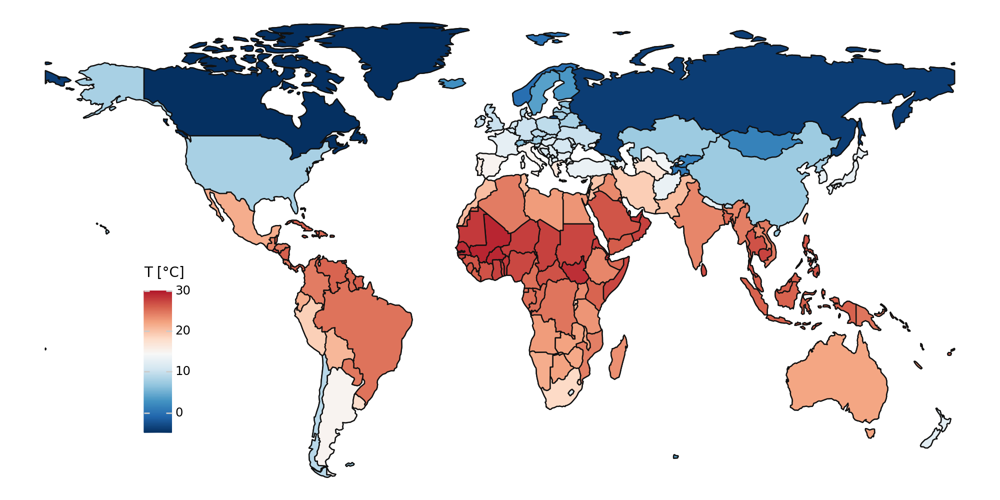

In [15]:
f_t = (climate_df
       .groupby('country',as_index=False)
       .mean(numeric_only=True)
       .merge(world)
 .pipe(lambda dd: p9.ggplot(dd) 
      + p9.aes(fill='temperature')
      + p9.geom_map(data=world, fill='gray')
      + p9.geom_map()
      + p9.scale_fill_gradientn(colors=custom_palette, limits=(-5, 30))
      + p9.theme_void()
      + p9.labs(fill='T [°C]')
      + p9.theme(figure_size=(10, 5), legend_position=(.15, .20), legend_key_size=14,
                      legend_title=p9.element_text(size=10)))
)
#p9.ggsave(f_t, '../../results/figures/t_map.pdf')
f_t

## What is the average absolute humidity (g/m³) in each country?

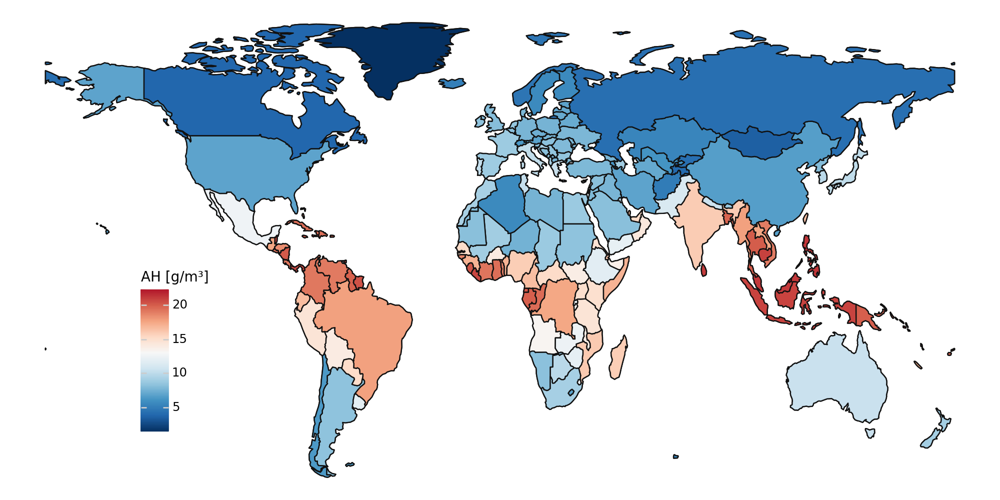

In [16]:
f_t = (climate_df
       .groupby('country',as_index=False)
       .mean(numeric_only=True)
       .merge(world)
 .pipe(lambda dd: p9.ggplot(dd) 
      + p9.aes(fill='absolute_humidity')
      + p9.geom_map(data=world, fill='gray')
      + p9.geom_map()
      + p9.scale_fill_gradientn(colors=custom_palette)
      + p9.theme_void()
      + p9.labs(fill='AH [g/m³]')
      + p9.theme(figure_size=(10, 5), legend_position=(.15, .20), legend_key_size=14,
                      legend_title=p9.element_text(size=10)))
)
#p9.ggsave(f_t, '../../results/figures/t_map.pdf')
f_t

## What is the daily number of confirmed cases?

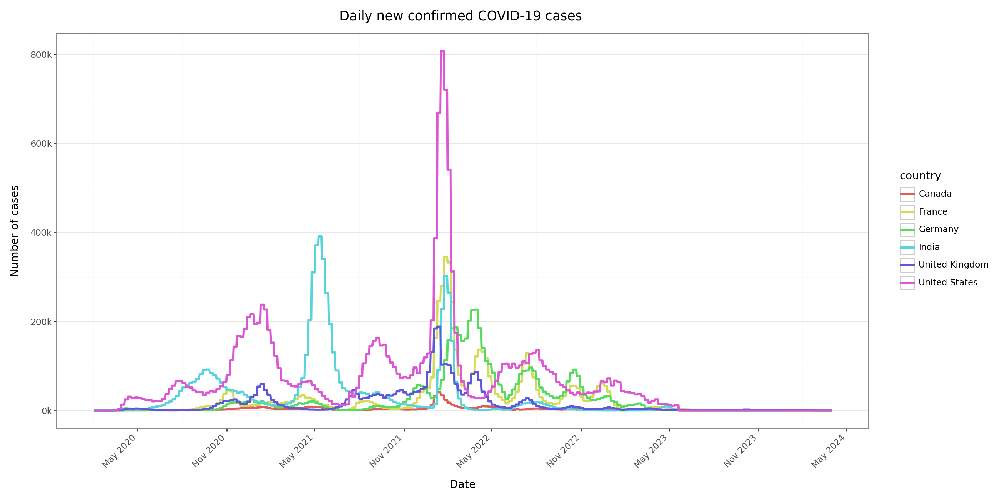

In [17]:
# Define subset of countries
subset_countries = ['United States','France', 'Canada','Germany', 'United Kingdom','India']
#subset_countries = ['India', 'United States','Indonesia','Pakistan','Nigeria','Brazil','Bangladesh','Russia','Mexico']

# Filter data for the selected countries
subset_data = covid_df[covid_df['country'].isin(subset_countries)]

# Plotting
f_t = (p9.ggplot(subset_data)
       + p9.aes(x='date', y='new_cases', group='country', color='country')
       + p9.geom_line(size=1.2)
       + p9.scale_x_datetime(date_breaks='6 months', date_labels='%b %Y')
       + p9.scale_y_continuous(labels=lambda x: ['{:.0f}{}'.format(val / 1000, 'k') if val < 1000000 else '{:.0f}{}'.format(val / 1000000, 'M') for val in x])
       + p9.theme_bw()
       + p9.theme(axis_text_x=p9.element_text(rotation=45, hjust=1))
       + p9.theme(panel_grid_major_x=p9.element_blank())
       + p9.labs(title='Daily new confirmed COVID-19 cases ', x='Date', y='Number of cases')
       + p9.theme(figure_size=(14, 7))  # Adjust the figure size as needed
      )

f_t

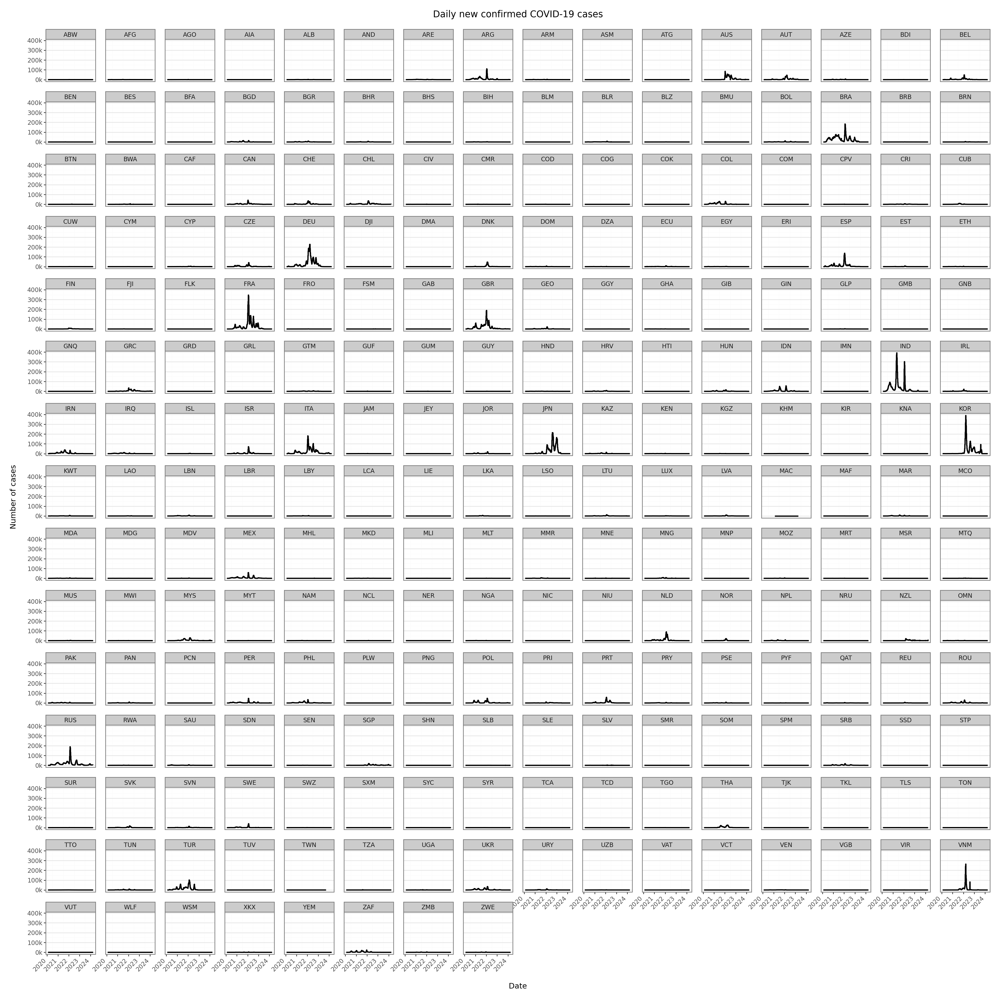

In [18]:
# Define countries to exclude
countries_to_exclude = ['China', 'United States']

# Filter out data for countries to exclude
covid_df_excluding_countries = covid_df[~covid_df['country'].isin(countries_to_exclude)]

# Plotting
f_t = (p9.ggplot(covid_df_excluding_countries )
       + p9.aes(x='date', y='new_cases')
       + p9.geom_line(color='black', size=1, group=1)
       + p9.scale_x_datetime(date_breaks='1 year', date_labels='%Y')
       + p9.scale_y_continuous(labels=lambda x: ['{:.0f}{}'.format(val / 1000, 'k') if val < 1000000 else '{:.0f}{}'.format(val / 1000000, 'M') for val in x])
       + p9.theme_bw()
       + p9.theme(axis_text_x=p9.element_text(rotation=45, hjust=1))
       + p9.theme(panel_grid_major_x=p9.element_blank())
       + p9.labs(title='Daily new confirmed COVID-19 cases', x='Date', y='Number of cases')
       + p9.theme(figure_size=(20, 20))  # Adjust the figure size as needed
       + p9.facet_wrap('~ iso3') 
      )

f_t

## What is the cumulative number of confirmed cases?

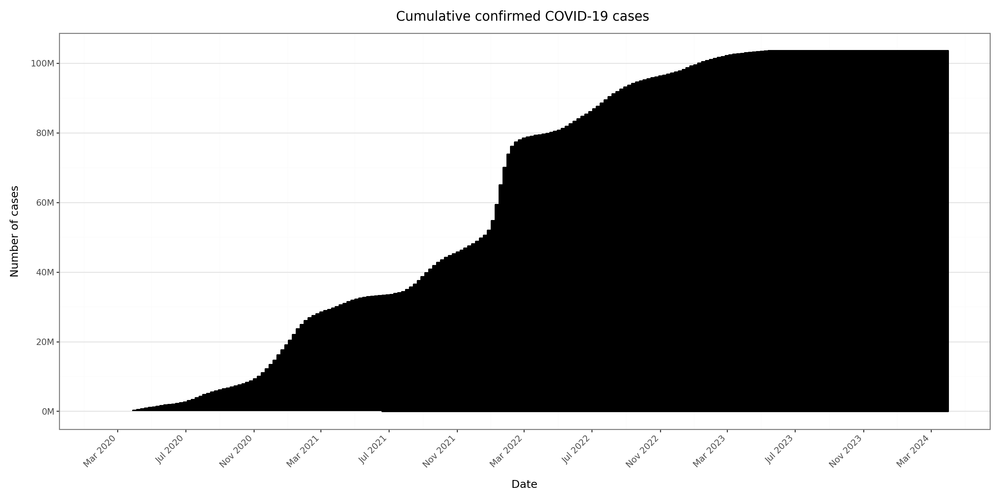

In [19]:
# Plotting
f_t = (p9.ggplot(covid_df)
       + p9.aes(x='date', y='total_cases')
       + p9.geom_line(size=1.2)
       + p9.scale_x_datetime(date_breaks='4 months', date_labels='%b %Y')
       + p9.scale_y_continuous(breaks=range(0, int(covid_df['total_cases'].max()) + 20000000, 20000000),
                              labels=lambda x: ['{:.0f}M'.format(val / 1000000) for val in x])
       + p9.theme_bw()
       + p9.theme(axis_text_x=p9.element_text(rotation=45, hjust=1))
       + p9.theme(panel_grid_major_x=p9.element_blank())
       + p9.labs(title='Cumulative confirmed COVID-19 cases ', x='Date', y='Number of cases')
       + p9.theme(figure_size=(14, 7))  # Adjust the figure size as needed
      )

f_t

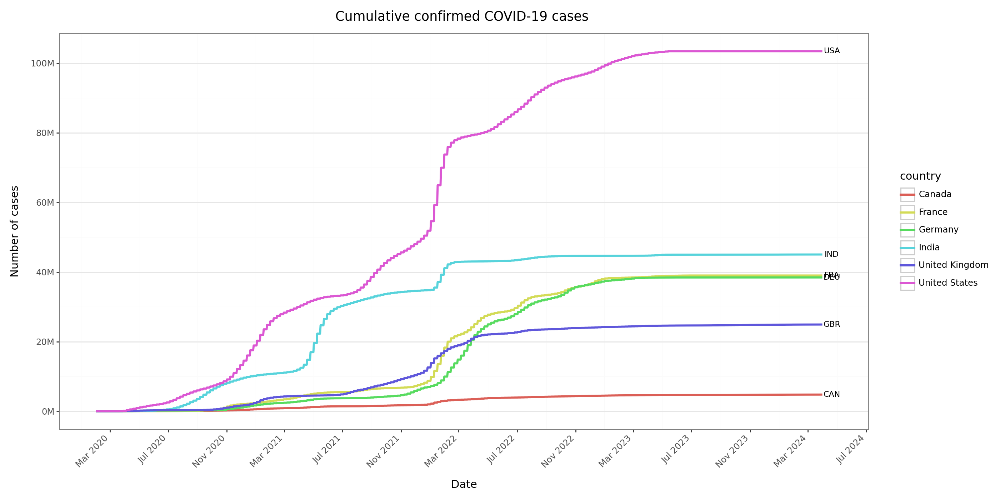

In [20]:
# Plotting
f_t = (p9.ggplot(subset_data)
       + p9.aes(x='date', y='total_cases', group='country', color='country')
       + p9.geom_line(size=1.2)
       + p9.geom_text(data=subset_data.groupby('country').tail(1), mapping=p9.aes(label='iso3'), nudge_x=20, nudge_y=0, size=8, color='black', show_legend=False)
       + p9.scale_x_datetime(date_breaks='4 months', date_labels='%b %Y')
       + p9.scale_y_continuous(breaks=range(0, int(subset_data['total_cases'].max()) + 20000000, 20000000),
                              labels=lambda x: ['{:.0f}M'.format(val / 1000000) for val in x])
       + p9.theme_bw()
       + p9.theme(axis_text_x=p9.element_text(rotation=45, hjust=1))
       + p9.theme(panel_grid_major_x=p9.element_blank())
       + p9.labs(title='Cumulative confirmed COVID-19 cases ', x='Date', y='Number of cases')
       + p9.theme(figure_size=(14, 7))  # Adjust the figure size as needed
      )

f_t

## What is the cumulative number of confirmed cases per million people?

C:\Users\brand\AppData\Local\Temp\ipykernel_16372\3548106245.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


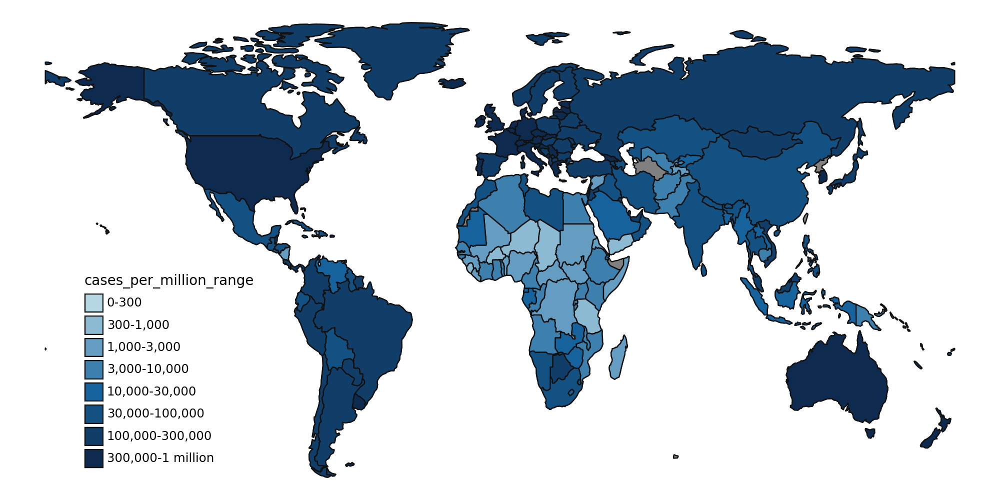

In [21]:
selected_covid_df = covid_df[covid_df['date']=='2024-03-31']
selected_covid_df['cases_per_million_range'] = pd.cut(selected_covid_df['total_cases'] / selected_covid_df['population'] * 1000000,
                                                      bins=[0, 300, 1000, 3000, 10000, 30000, 100000, 300000, 1000000],
                                                      labels=['0-300', '300-1,000', '1,000-3,000', '3,000-10,000', '10,000-30,000', '30,000-100,000', '100,000-300,000', '300,000-1 million'])

f_t = (selected_covid_df
       .merge(world, on='iso3')
 .pipe(lambda dd: p9.ggplot(dd) 
      + p9.aes(fill='cases_per_million_range')
      + p9.geom_map(data=world, fill='gray')
      + p9.geom_map()
      + p9.scale_fill_manual(values=['#b5d7e4', '#8dbad3', '#659cc2', '#3d7fad', '#15629c', '#125182', '#103e69', '#0e2b4f']) 
      + p9.theme_void()
      + p9.labs()
      + p9.theme(figure_size=(10, 5), legend_position=(.10, .10), legend_key_size=14,
                      legend_title=p9.element_text(size=10)))
)
f_t
#p9.ggsave(f_t, '../../results/figures/t_map.pdf')

## What is the daily number of confirmed deaths?

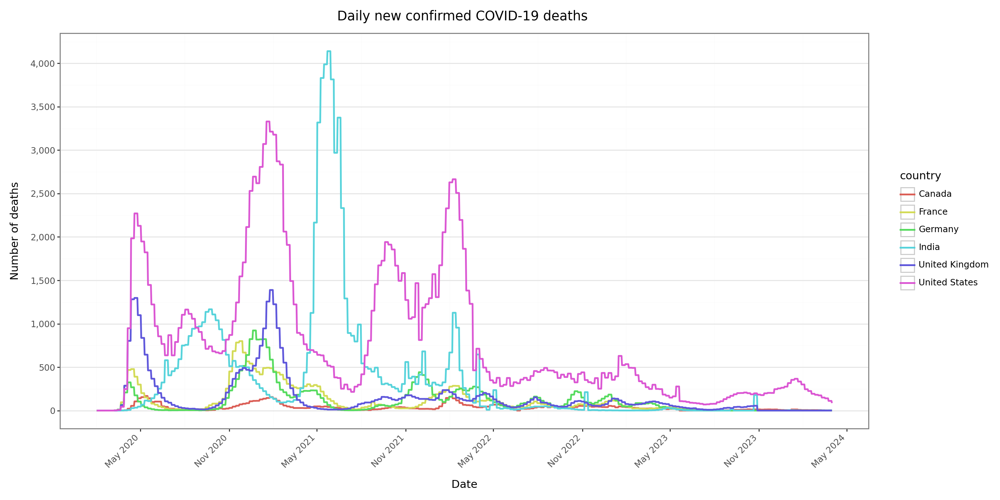

In [22]:
# Plotting
f_t = (p9.ggplot(subset_data)
       + p9.aes(x='date', y='new_deaths', group='country', color='country')
       + p9.geom_line(size=1)
       + p9.scale_x_datetime(date_breaks='6 months', date_labels='%b %Y')
       + p9.scale_y_continuous(labels=lambda x: ['{:,.0f}'.format(val) for val in x], breaks=range(0, int(max(subset_data['new_deaths'])), 500))
       + p9.theme_bw()
       + p9.theme(axis_text_x=p9.element_text(rotation=45, hjust=1))
       + p9.theme(panel_grid_major_x=p9.element_blank())
       + p9.labs(title='Daily new confirmed COVID-19 deaths ', x='Date', y='Number of deaths')
       + p9.theme(figure_size=(14, 7))  # Adjust the figure size as needed
      )

f_t


## What is the cumulative number of confirmed deaths?

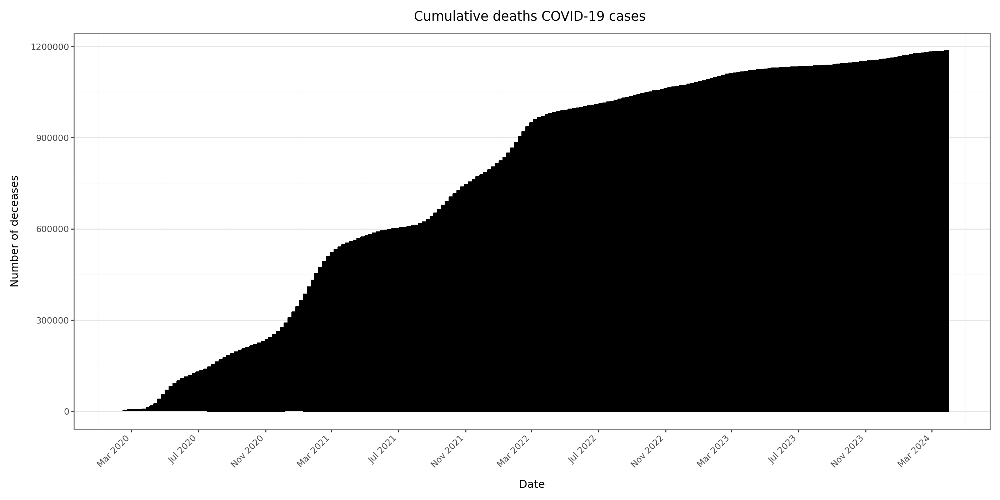

In [23]:
# Plotting
f_t = (p9.ggplot(covid_df)
       + p9.aes(x='date', y='total_deaths')
       + p9.geom_line(size=1.2)
       + p9.scale_x_datetime(date_breaks='4 months', date_labels='%b %Y')
       + p9.theme_bw()
       + p9.theme(axis_text_x=p9.element_text(rotation=45, hjust=1))
       + p9.theme(panel_grid_major_x=p9.element_blank())
       + p9.labs(title='Cumulative deaths COVID-19 cases ', x='Date', y='Number of deceases')
       + p9.theme(figure_size=(14, 7))  # Adjust the figure size as needed
      )

f_t

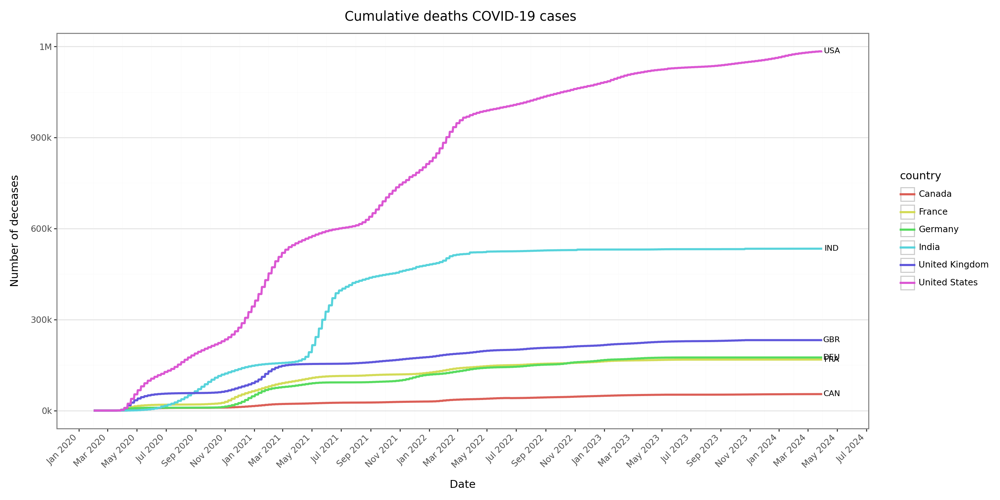

In [24]:
# Plotting
f_t = (p9.ggplot(subset_data)
       + p9.aes(x='date', y='total_deaths', group='country', color='country')
       + p9.geom_line(size=1.2)
       + p9.geom_text(data=subset_data.groupby('country').tail(1), mapping=p9.aes(label='iso3'), nudge_x=20, nudge_y=0, size=8, color='black', show_legend=False)
       + p9.scale_x_datetime(date_breaks='2 months', date_labels='%b %Y')
       + p9.scale_y_continuous(labels=lambda x: ['{:.0f}{}'.format(val / 1000, 'k') if val < 1000000 else '{:.0f}{}'.format(val / 1000000, 'M') for val in x])
       + p9.theme_bw()
       + p9.theme(axis_text_x=p9.element_text(rotation=45, hjust=1))
       + p9.theme(panel_grid_major_x=p9.element_blank())
       + p9.labs(title='Cumulative deaths COVID-19 cases ', x='Date', y='Number of deceases')
       + p9.theme(figure_size=(14, 7))  # Adjust the figure size as needed
      )

f_t

## What is the cumulative number of confirmed deaths per million people?

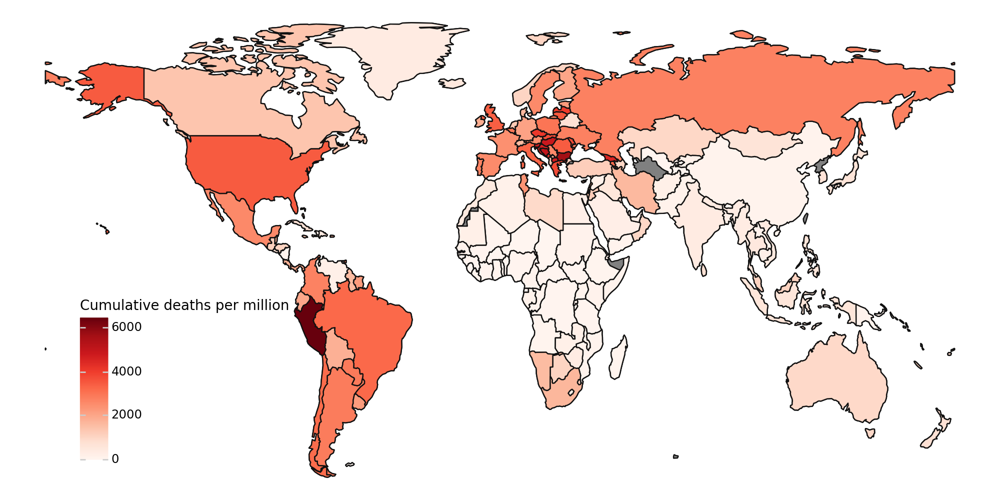

In [25]:
selected_covid_df = covid_df[covid_df['date']=='2024-03-31']
#selected_covid_df['deaths_per_million_range'] = pd.cut(selected_covid_df['total_deaths'] / selected_covid_df['population'] * 1000000,
                                                     #bins=[0, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000],
                                                     #labels=['0-1,000', '1,000-2,000', '2,000-3,000', '3,000-4,000', '4,000-5,000', '5,000-6,000', '6,000-7,000', '7,000-8,000'])

f_t = (selected_covid_df
       .merge(world, on='iso3')
 .pipe(lambda dd: p9.ggplot(dd) 
      + p9.aes(fill='total_deaths / population * 1000000')
      + p9.geom_map(data=world, fill='gray')
      + p9.geom_map()
      + p9.scale_fill_continuous('Reds')
      + p9.theme_void()
      + p9.labs(fill='Cumulative deaths per million')
      + p9.theme(figure_size=(10, 5), legend_position=(.10, .10), legend_key_size=14,
                      legend_title=p9.element_text(size=10)))
)
f_t
#p9.ggsave(f_t, '../../results/figures/t_map.pdf')

## What was the distribution of COVID variants through time?

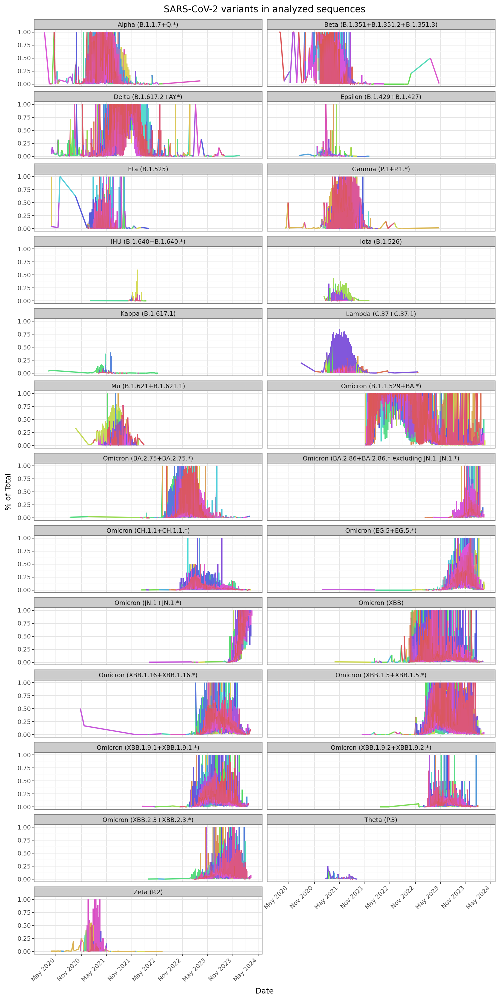

In [26]:
# Plotting
selected_variants_df = variants_df[variants_df['Value']!='Other'].merge(country_to_iso)
f_t = (p9.ggplot(selected_variants_df)
       + p9.aes(x='Week prior to', y='% per Country and Week', group ='country', color='country')
       + p9.geom_line(size=1, group=1)
       + p9.scale_x_datetime(date_breaks='6 months', date_labels='%b %Y')
       + p9.theme_bw()
       + p9.theme(axis_text_x=p9.element_text(rotation=45, hjust=1))
       + p9.labs(title='SARS-CoV-2 variants in analyzed sequences', x='Date', y='% of Total')
       + p9.theme(figure_size=(10, 20))  # Adjust the figure size as needed
       + p9.facet_wrap('~ Value', nrow=None, ncol=2) 
       + p9.theme(legend_position='none')
      )

f_t

## What share of the population has received at least one dose of vaccine?

C:\Users\brand\AppData\Local\Temp\ipykernel_16372\3654996126.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


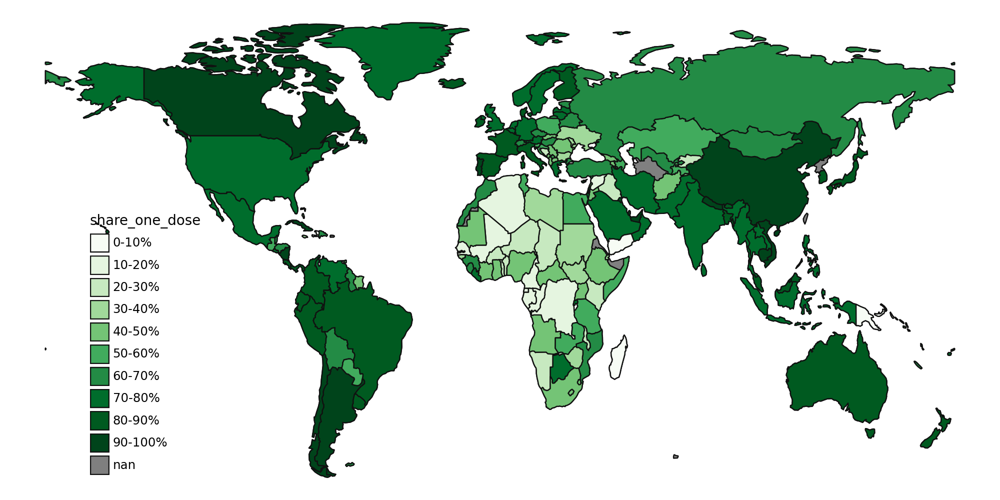

In [27]:
selected_covid_df = covid_df[covid_df['date']=='2024-03-31']
selected_covid_df['share_one_dose'] = pd.cut(selected_covid_df['people_vaccinated'] / selected_covid_df['population'],
                                                      bins=[0, .10, .20, .30, .40, .50, .60, .70, .80, .90, 11],
                                                      labels=['0-10%', '10-20%', '20-30%', '30-40%', '40-50%', '50-60%', '60-70%', '70-80%', '80-90%','90-100%'])

f_t = (selected_covid_df
       .merge(world, on='iso3')
 .pipe(lambda dd: p9.ggplot(dd) 
      + p9.aes(fill='share_one_dose')
      + p9.geom_map(data=world, fill='gray')
      + p9.geom_map()
      + p9.scale_fill_manual(values=['#F7FCF5', '#E5F5E0', '#C7E9C0', '#A1D99B', '#74C476', '#41AB5D', '#238B45', '#006D2C', '#005A20', '#00441B'])
      + p9.theme_void()
      + p9.labs()
      + p9.theme(figure_size=(10, 5), legend_position=(.10, .10), legend_key_size=14,
                      legend_title=p9.element_text(size=10)))
)
f_t
#p9.ggsave(f_t, '../../results/figures/t_map.pdf')

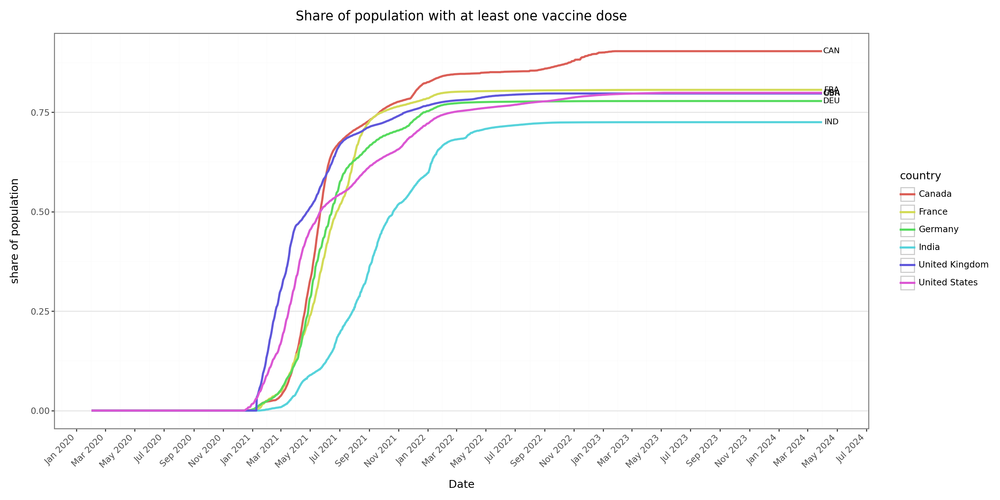

In [28]:
# Plotting
f_t = (p9.ggplot(subset_data)
       + p9.aes(x='date', y='people_vaccinated/population', group='country', color='country')
       + p9.geom_line(size=1.2)
       + p9.geom_text(data=subset_data.groupby('country').tail(1), mapping=p9.aes(label='iso3'), nudge_x=20, nudge_y=0, size=8, color='black', show_legend=False)
       + p9.scale_x_datetime(date_breaks='2 months', date_labels='%b %Y')
       + p9.theme_bw()
       + p9.theme(axis_text_x=p9.element_text(rotation=45, hjust=1))
       + p9.theme(panel_grid_major_x=p9.element_blank())
       + p9.labs(title='Share of population with at least one vaccine dose', x='Date', y='share of population')
       + p9.theme(figure_size=(14, 7))  # Adjust the figure size as needed
      )

f_t

## What share of the population has completed the initial vaccination protocol?

C:\Users\brand\AppData\Local\Temp\ipykernel_16372\4075574049.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


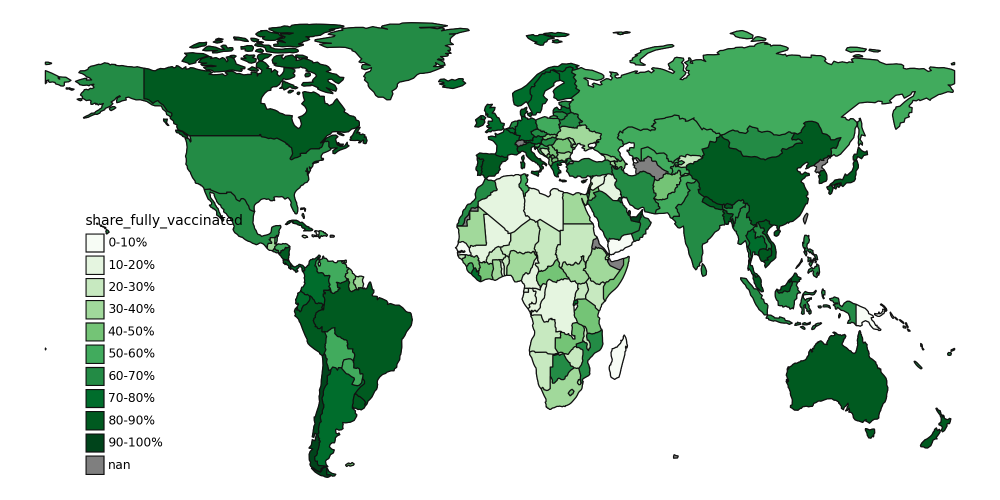

In [29]:
selected_covid_df = covid_df[covid_df['date']=='2024-03-31']
selected_covid_df['share_fully_vaccinated'] = pd.cut(selected_covid_df['people_fully_vaccinated'] / selected_covid_df['population'],
                                                      bins=[0, .10, .20, .30, .40, .50, .60, .70, .80, .90, 11],
                                                      labels=['0-10%', '10-20%', '20-30%', '30-40%', '40-50%', '50-60%', '60-70%', '70-80%', '80-90%','90-100%'])

f_t = (selected_covid_df
       .merge(world, on='iso3')
 .pipe(lambda dd: p9.ggplot(dd) 
      + p9.aes(fill='share_fully_vaccinated')
      + p9.geom_map(data=world, fill='gray')
      + p9.geom_map()
      + p9.scale_fill_manual(values=['#F7FCF5', '#E5F5E0', '#C7E9C0', '#A1D99B', '#74C476', '#41AB5D', '#238B45', '#006D2C', '#005A20', '#00441B'])
      + p9.theme_void()
      + p9.labs()
      + p9.theme(figure_size=(10, 5), legend_position=(.10, .10), legend_key_size=14,
                      legend_title=p9.element_text(size=10)))
)
f_t
#p9.ggsave(f_t, '../../results/figures/t_map.pdf')

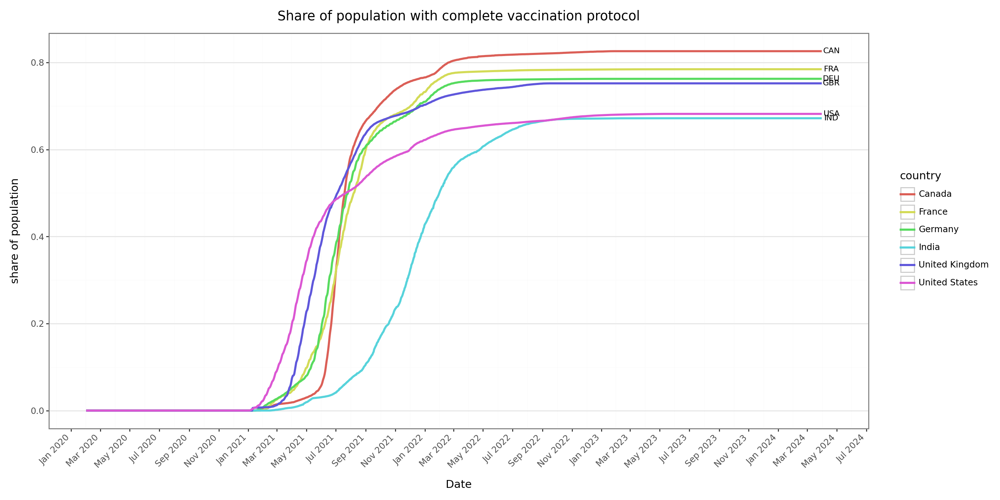

In [30]:
# Plotting
f_t = (p9.ggplot(subset_data)
       + p9.aes(x='date', y='people_fully_vaccinated/population', group='country', color='country')
       + p9.geom_line(size=1.2)
       + p9.geom_text(data=subset_data.groupby('country').tail(1), mapping=p9.aes(label='iso3'), nudge_x=20, nudge_y=0, size=8, color='black', show_legend=False)
       + p9.scale_x_datetime(date_breaks='2 months', date_labels='%b %Y')
       + p9.theme_bw()
       + p9.theme(axis_text_x=p9.element_text(rotation=45, hjust=1))
       + p9.theme(panel_grid_major_x=p9.element_blank())
       + p9.labs(title='Share of population with complete vaccination protocol', x='Date', y='share of population')
       + p9.theme(figure_size=(14, 7))  # Adjust the figure size as needed
      )

f_t

## How many vaccine booster doses have been administered?

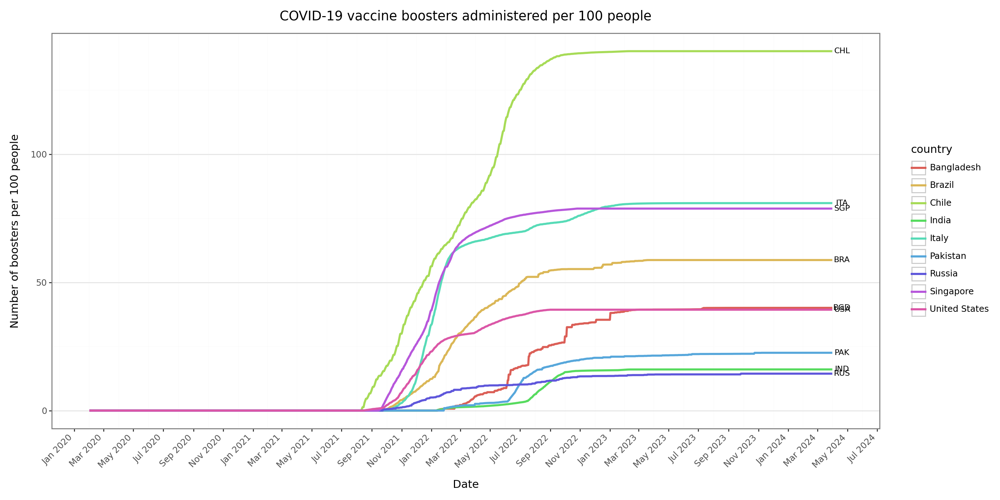

In [31]:
# Define subset of countries
subset_countries = ['Chile','Italy','Singapore',
                    'Brazil','United States','Bangladesh',
                    'Pakistan','India','Russia'
                    ]
#subset_countries = ['India', 'United States','Indonesia','Pakistan','Nigeria','Brazil','Bangladesh','Russia','Mexico']

# Filter data for the important countries
subset_data = covid_df[covid_df['country'].isin(subset_countries)]

# Plotting
f_t = (p9.ggplot(subset_data)
       + p9.aes(x='date', y='total_boosters/population*100', group='country', color='country')
       + p9.geom_line(size=1.2)
       + p9.geom_text(data=subset_data.groupby('country').tail(1), mapping=p9.aes(label='iso3'), nudge_x=20, nudge_y=0, size=8, color='black', show_legend=False)
       + p9.scale_x_datetime(date_breaks='2 months', date_labels='%b %Y')
       + p9.theme_bw()
       + p9.theme(axis_text_x=p9.element_text(rotation=45, hjust=1))
       + p9.theme(panel_grid_major_x=p9.element_blank())
       + p9.labs(title='COVID-19 vaccine boosters administered per 100 people', x='Date', y='Number of boosters per 100 people')
       + p9.theme(figure_size=(14, 7))  # Adjust the figure size as needed
      )

f_t

## Correlations between  variables

In [32]:
# Set a specific date
rates = covid_df[covid_df['date']=='2024-03-31']

# Case Rate per 100,000 people
rates['Case Rate'] = rates['total_cases']/rates['population'] * 100000
# Death Rate per 100,000 people
rates['Death Rate'] = rates['total_deaths']/rates['population'] * 100000

# Get rates and countries
rates = rates[['country','continent','iso3','Case Rate','Death Rate']]

# Assign regions to countries and merge socioeconomic
regions = pd.read_csv('../data/world_regions.csv')
rates_socio = (rates
               .merge(socioeconomical_df, on='iso3')
               .merge(regions, on='iso3')
               .drop(columns=['country_y', 'name'])
               .rename(columns={'country_x': 'country'})
              )

# Move column order
cols = rates_socio.columns.to_list()
last_col = cols[-1]
new_cols = cols[:3] + [last_col] + cols[3:-1]
rates_socio = rates_socio[new_cols]

# Merge climate variables
climate_df_p = climate_df.groupby('iso3',as_index=False).mean(numeric_only=True)[['iso3','temperature','absolute_humidity']]
corrvars = (rates_socio
            .merge(climate_df_p,on='iso3',how='left')
            .rename(columns={'country_x':'country'})
            )

# Define the desired column order
desired_columns = ['country','iso3', 'continent', 'region', 'Population density', 'GDP per capita',
                   'Inflation rate', 'Health expenditure per capita', 'Unemployment rate','Extreme poverty',
                   'Life expectancy','Crude death rate', 'Population aged 65 and above', 'Tobacco use', 
                   'Hospital beds', 'Air Passengers', 'Lower secondary', 'Pupil-teacher ratio', 
                   'Education expenditure', 'Diabetes prevalence', 'Health personnel', 
                   'temperature', 'absolute_humidity', 'Case Rate', 'Death Rate']

# Reorder the DataFrame columns
corrvars = corrvars[desired_columns]

C:\Users\brand\AppData\Local\Temp\ipykernel_16372\827685707.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\brand\AppData\Local\Temp\ipykernel_16372\827685707.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [33]:
corrvars

,country,iso3,continent,region,Population density,GDP per capita,Inflation rate,Health expenditure per capita,Unemployment rate,Extreme poverty,...,Air Passengers,Lower secondary,Pupil-teacher ratio,Education expenditure,Diabetes prevalence,Health personnel,temperature,absolute_humidity,Case Rate,Death Rate
0,Afghanistan,AFG,Asia,S. Asia,57.908252,497.741429,6.521480,74.234104,11.710,NaN,...,1.066747e+06,13.125810,48.78979,4.343190,7.6,0.6660,13.085972,4.891298,566.386957,19.414633
1,Armenia,ARM,Asia,Middle East,99.072778,4828.504886,1.065623,549.474365,12.200,1.0,...,1.936680e+05,96.469818,15.41859,2.571912,8.5,9.5800,7.773316,6.169507,16250.154650,315.665829
2,Azerbaijan,AZE,Asia,Middle East,121.280071,4805.753718,-0.241308,191.755524,5.000,0.7,...,2.585280e+06,95.519058,15.42982,3.176460,2.8,9.3890,13.713431,8.972435,8063.967080,99.950975
3,Bahrain,BHR,Asia,Middle East,1915.625641,25869.112913,0.083262,1024.390545,1.200,0.7,...,6.440562e+06,82.046509,11.92315,2.384604,19.5,3.1880,NaN,NaN,47316.702406,104.331028
4,Bangladesh,BGD,Asia,S. Asia,1271.538926,2122.078397,3.658168,47.667824,4.372,13.5,...,6.260241e+06,44.683552,30.05459,1.681388,10.5,1.0130,25.675171,19.905161,1197.244281,17.228591
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206,Paraguay,PRY,South America,S. America,16.436008,5807.838794,3.061879,415.888794,6.595,1.0,...,6.323890e+05,52.580002,24.15974,3.489830,6.5,2.8445,24.788403,15.179141,10850.710357,293.183124
207,Peru,PER,South America,S. America,25.644423,6955.880824,1.872216,366.564911,3.379,3.0,...,1.882057e+07,60.689999,17.38724,3.822430,6.0,4.3170,19.180239,14.658253,13288.701173,648.557040
208,Suriname,SUR,South America,S. America,3.848083,6690.044786,5.178909,592.975769,7.917,15.3,...,2.366010e+05,43.984100,13.39335,5.320321,8.9,4.5980,26.175610,20.475063,13347.873783,227.329357
209,Uruguay,URY,South America,S. America,19.588670,18098.361549,8.385848,1677.097900,8.734,0.1,...,3.695010e+08,58.090000,11.01930,4.641300,5.7,12.2480,17.781904,11.824658,30322.958190,222.771091


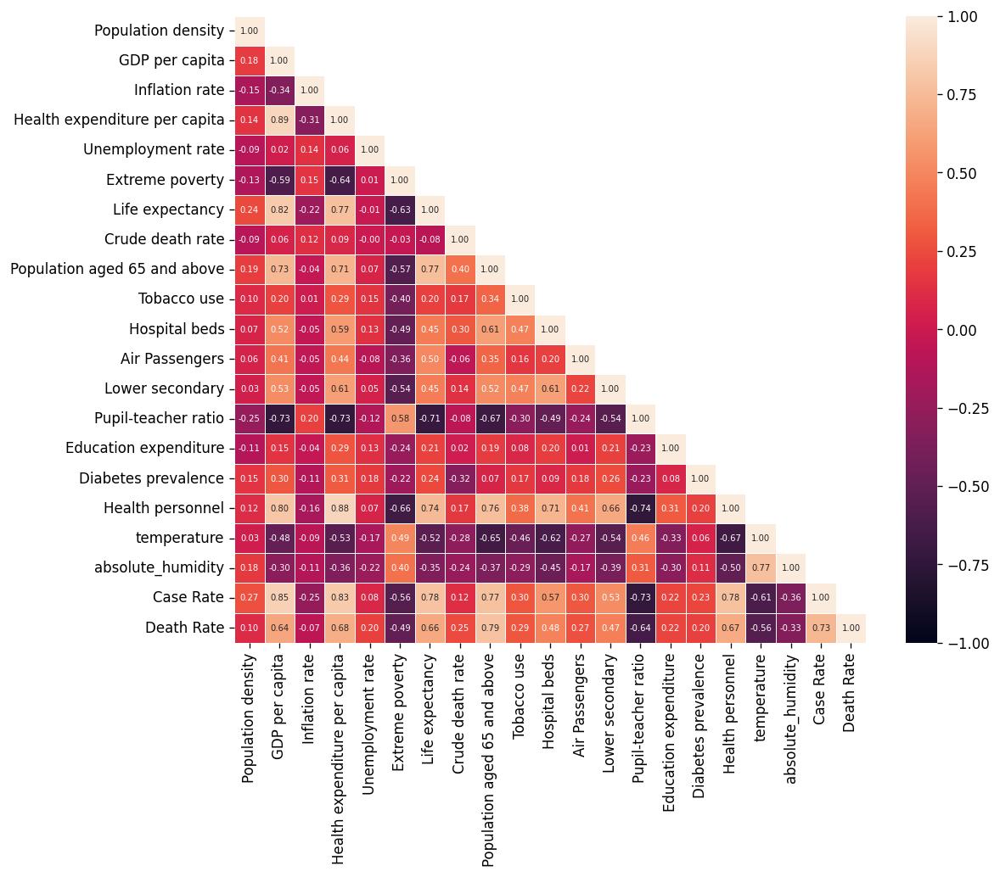

In [34]:
corr = corrvars.drop(['country','continent','region','iso3'], axis=1).corr(method='spearman')

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool),k=1)

plt.figure(figsize=(10,8), dpi=120)
sns.heatmap(corr, cmap = 'rocket', vmin = -1, vmax = 1, center = 0, annot=True, fmt=".2f", linewidth=.5, annot_kws={"size": 6}, mask=mask)
plt.show()

## Case Rate relationships

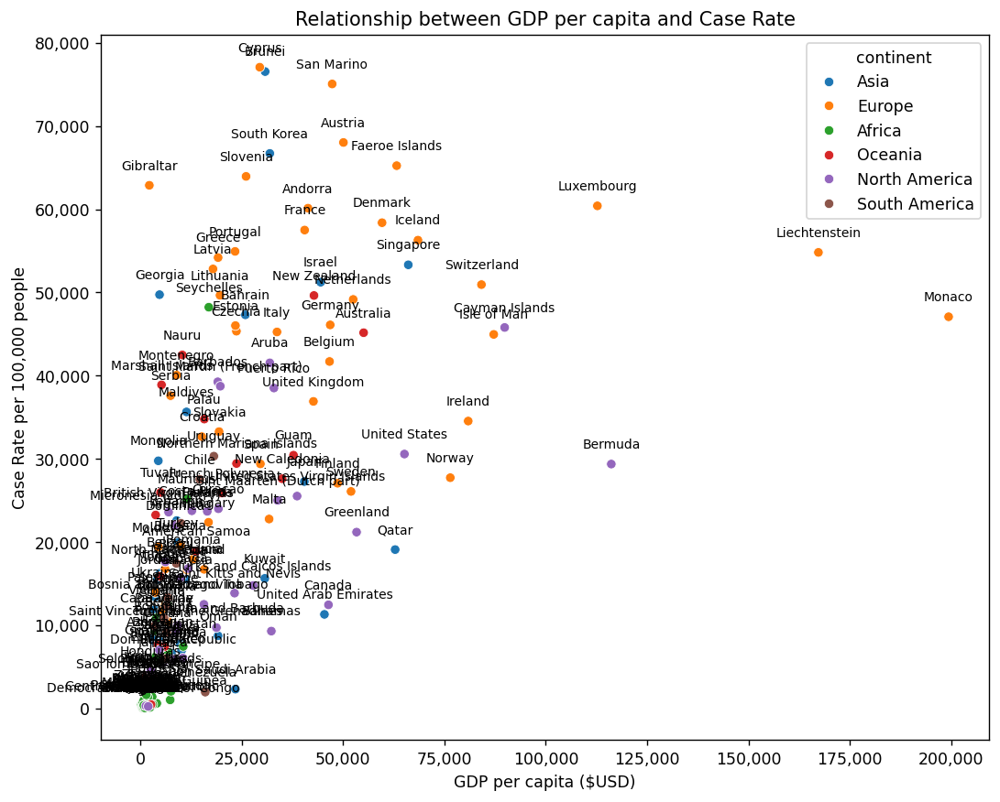

In [35]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="GDP per capita", y="Case Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['GDP per capita'], row['Case Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('GDP per capita ($USD)')
plt.ylabel('Case Rate per 100,000 people')
plt.title('Relationship between GDP per capita and Case Rate')

plt.show()

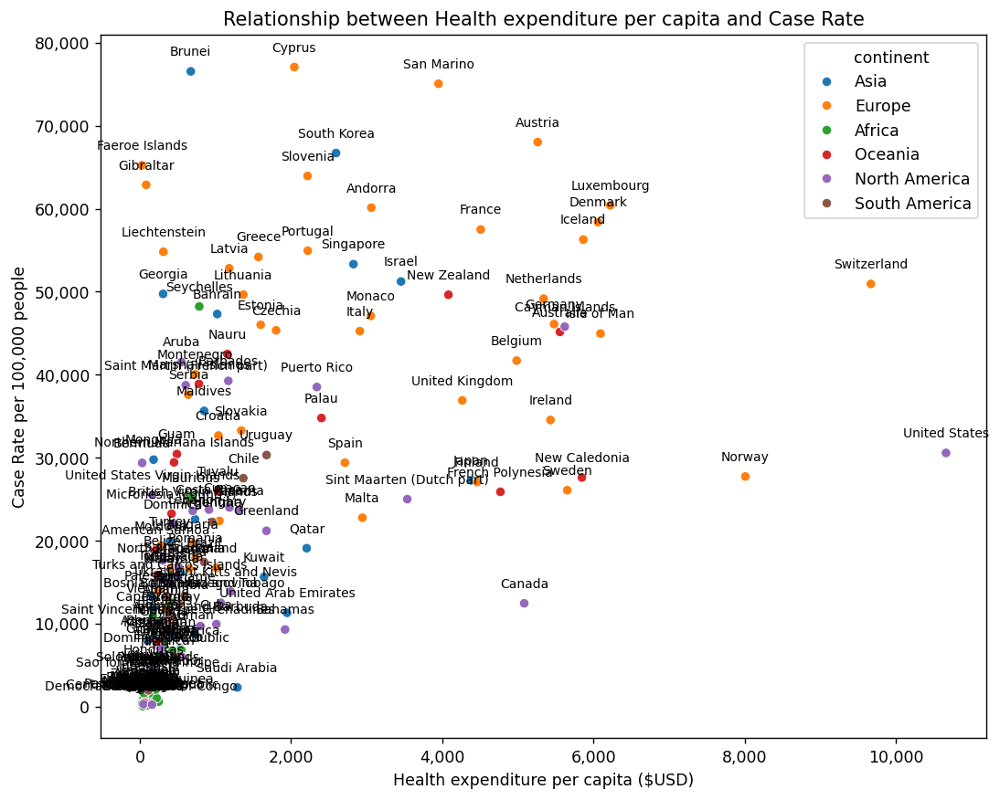

In [36]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="Health expenditure per capita", y="Case Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['Health expenditure per capita'], row['Case Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('Health expenditure per capita ($USD)')
plt.ylabel('Case Rate per 100,000 people')
plt.title('Relationship between Health expenditure per capita and Case Rate')

plt.show()

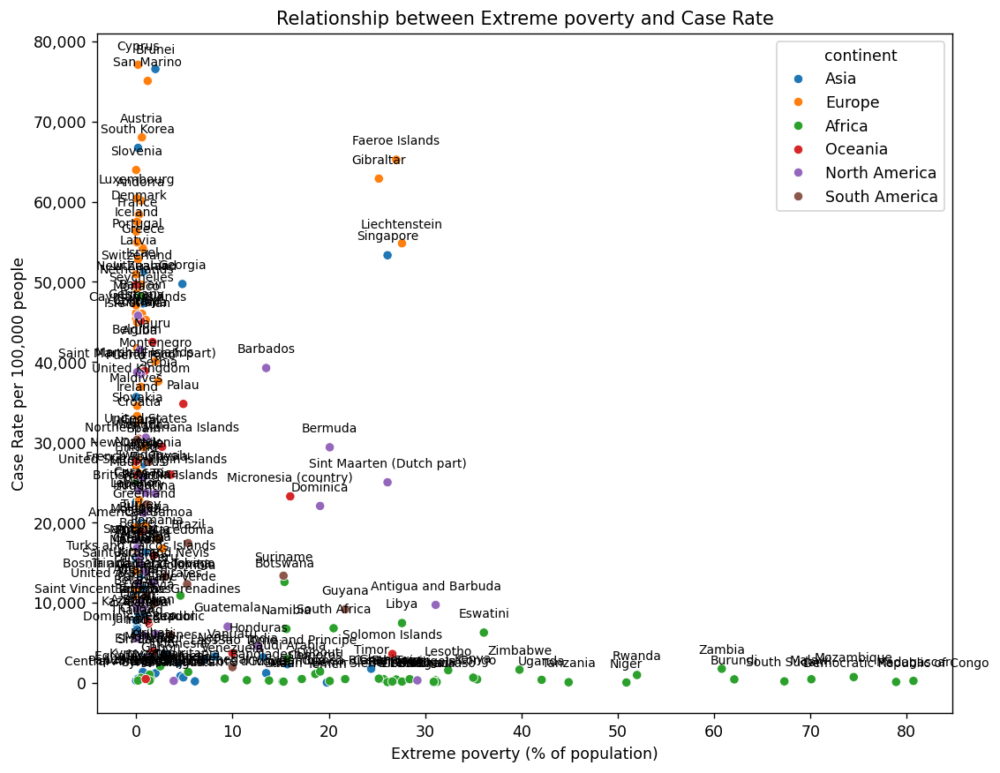

In [37]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="Extreme poverty", y="Case Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['Extreme poverty'], row['Case Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('Extreme poverty (% of population)')
plt.ylabel('Case Rate per 100,000 people')
plt.title('Relationship between Extreme poverty and Case Rate')

plt.show()

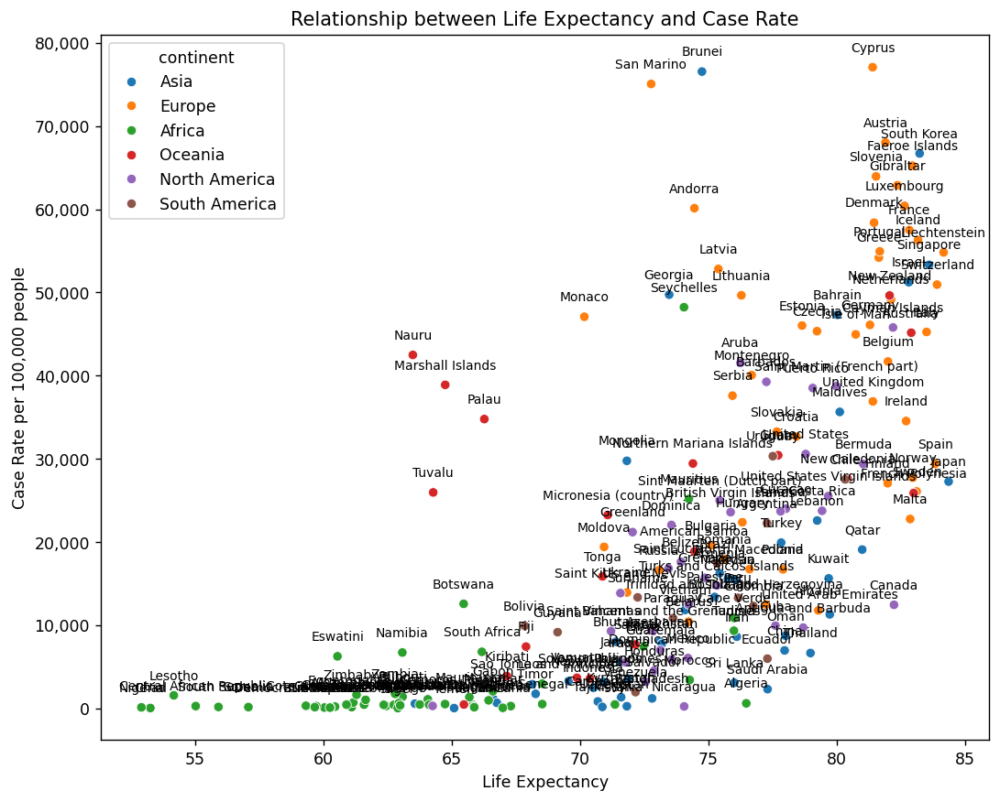

In [38]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="Life expectancy", y="Case Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['Life expectancy'], row['Case Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('Life Expectancy')
plt.ylabel('Case Rate per 100,000 people')
plt.title('Relationship between Life Expectancy and Case Rate')

plt.show()

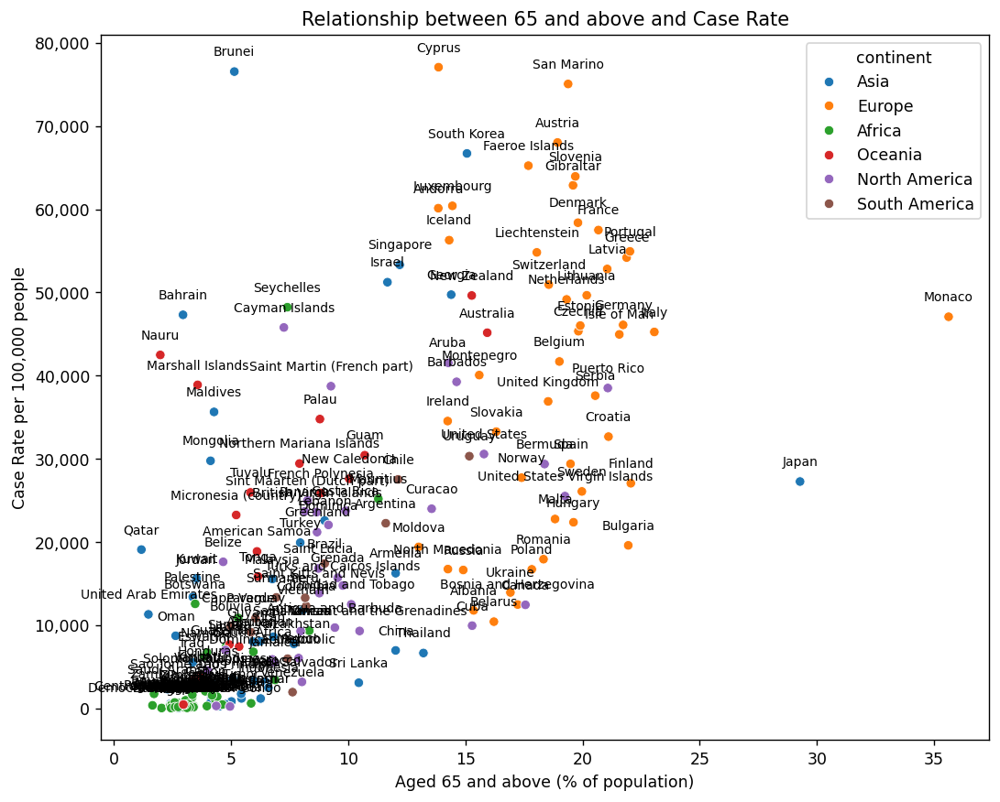

In [39]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="Population aged 65 and above", y="Case Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['Population aged 65 and above'], row['Case Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('Aged 65 and above (% of population)')
plt.ylabel('Case Rate per 100,000 people')
plt.title('Relationship between 65 and above and Case Rate')

plt.show()

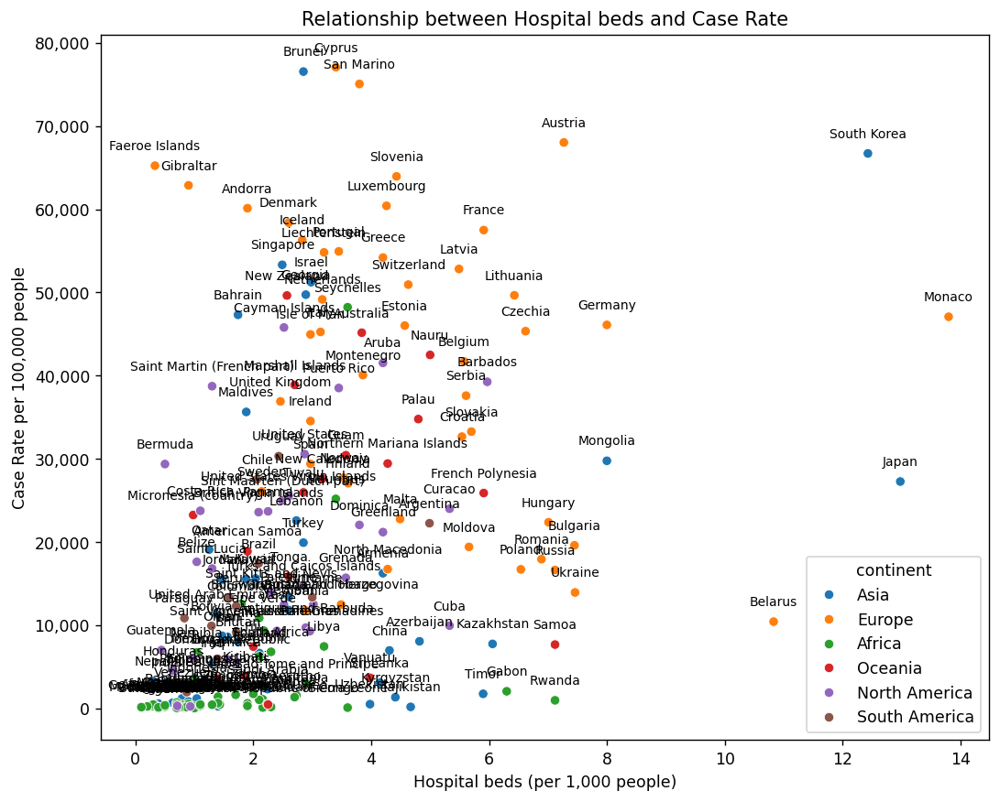

In [40]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="Hospital beds", y="Case Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['Hospital beds'], row['Case Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('Hospital beds (per 1,000 people)')
plt.ylabel('Case Rate per 100,000 people')
plt.title('Relationship between Hospital beds and Case Rate')

plt.show()

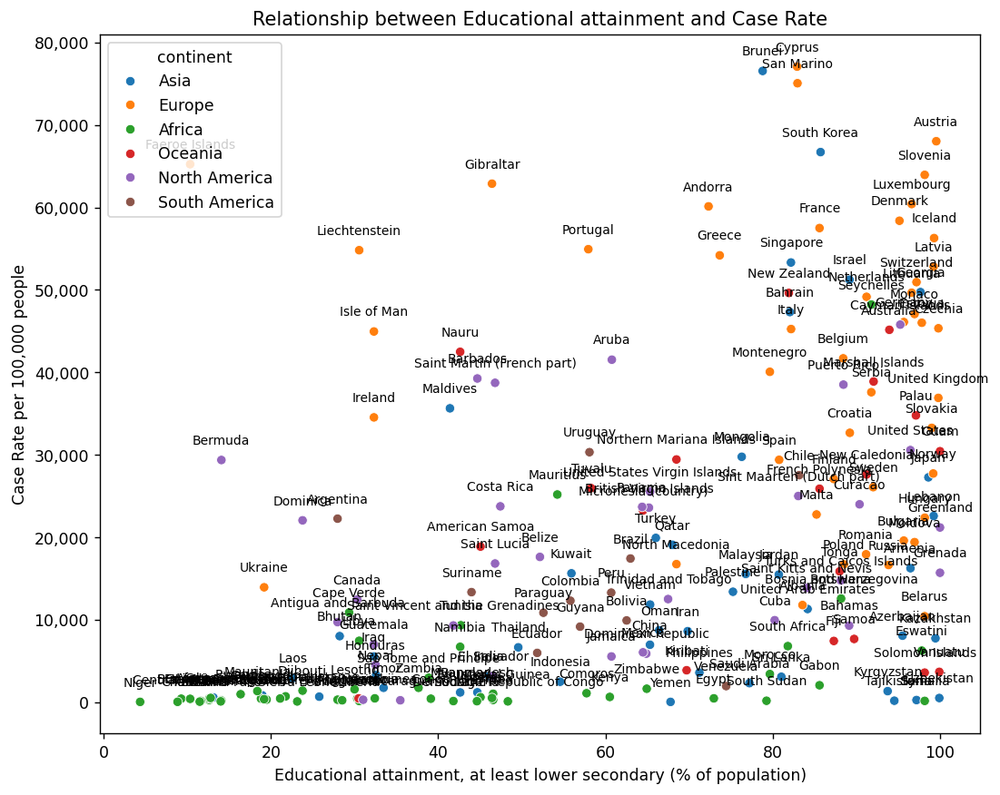

In [41]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="Lower secondary", y="Case Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['Lower secondary'], row['Case Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('Educational attainment, at least lower secondary (% of population)')
plt.ylabel('Case Rate per 100,000 people')
plt.title('Relationship between Educational attainment and Case Rate')

plt.show()

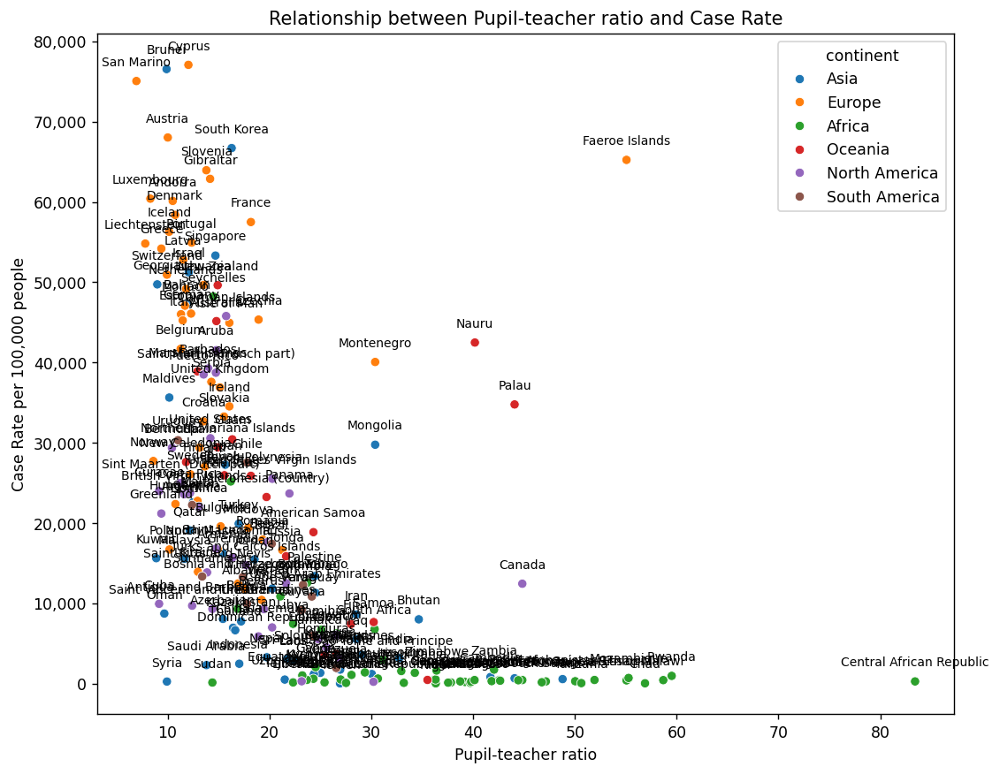

In [42]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="Pupil-teacher ratio", y="Case Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['Pupil-teacher ratio'], row['Case Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('Pupil-teacher ratio')
plt.ylabel('Case Rate per 100,000 people')
plt.title('Relationship between Pupil-teacher ratio and Case Rate')

plt.show()

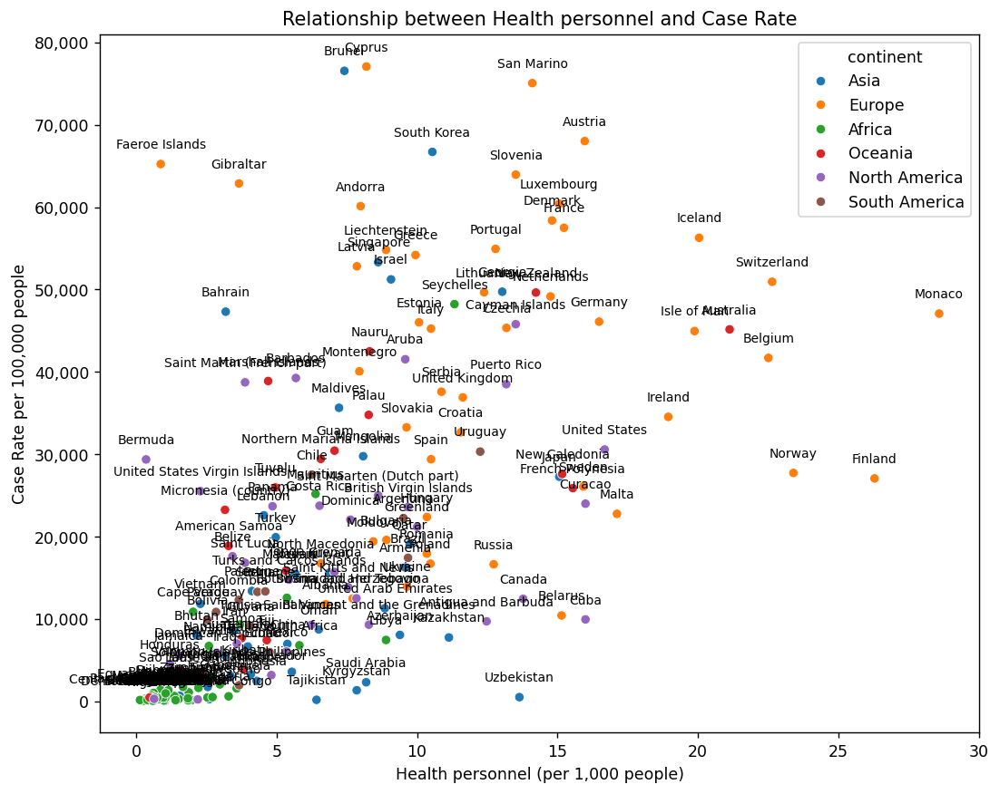

In [43]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="Health personnel", y="Case Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['Health personnel'], row['Case Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('Health personnel (per 1,000 people)')
plt.ylabel('Case Rate per 100,000 people')
plt.title('Relationship between Health personnel and Case Rate')

plt.show()

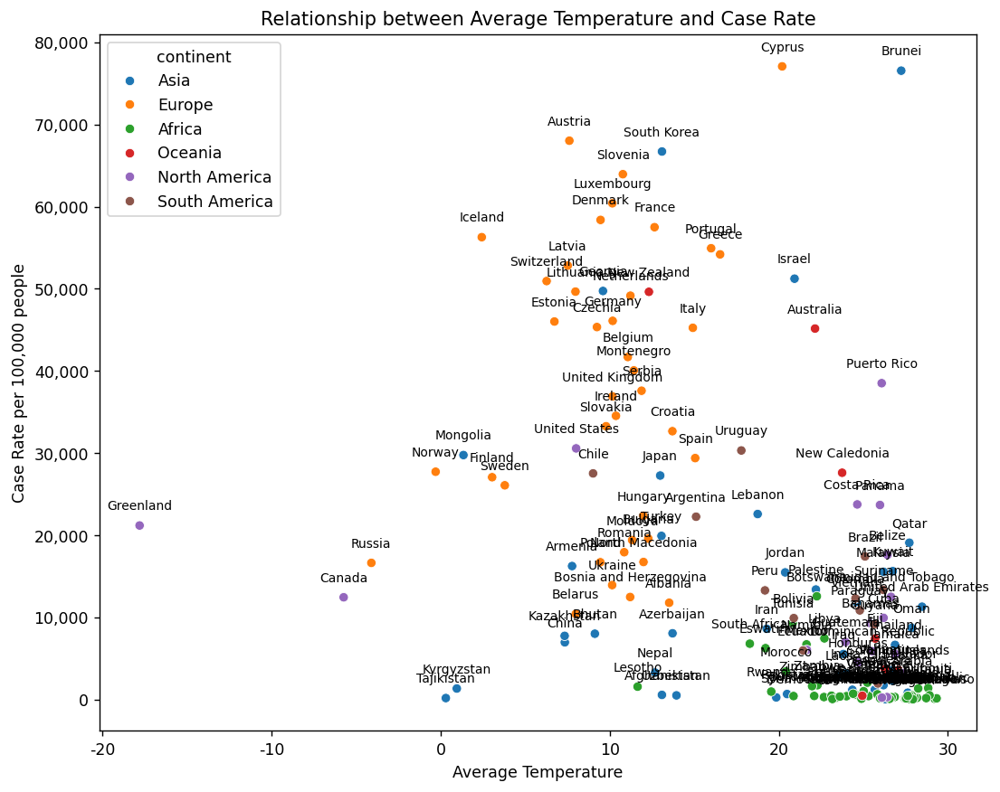

In [44]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="temperature", y="Case Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['temperature'], row['Case Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('Average Temperature')
plt.ylabel('Case Rate per 100,000 people')
plt.title('Relationship between Average Temperature and Case Rate')

plt.show()

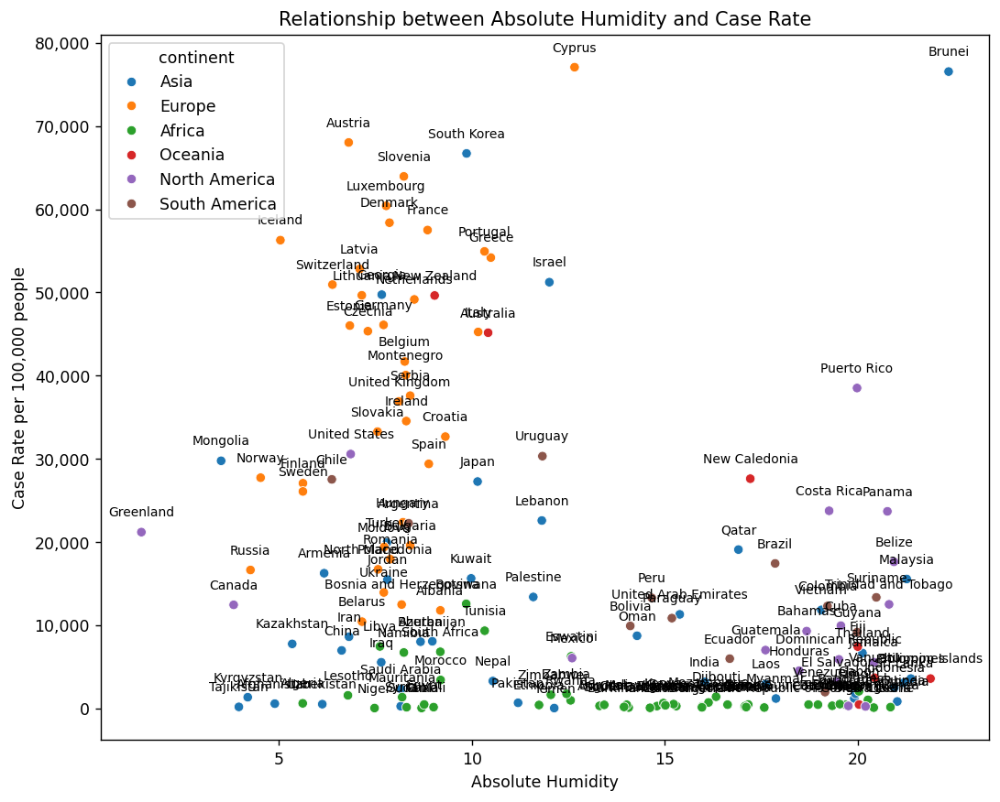

In [45]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="absolute_humidity", y="Case Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['absolute_humidity'], row['Case Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('Absolute Humidity')
plt.ylabel('Case Rate per 100,000 people')
plt.title('Relationship between Absolute Humidity and Case Rate')

plt.show()

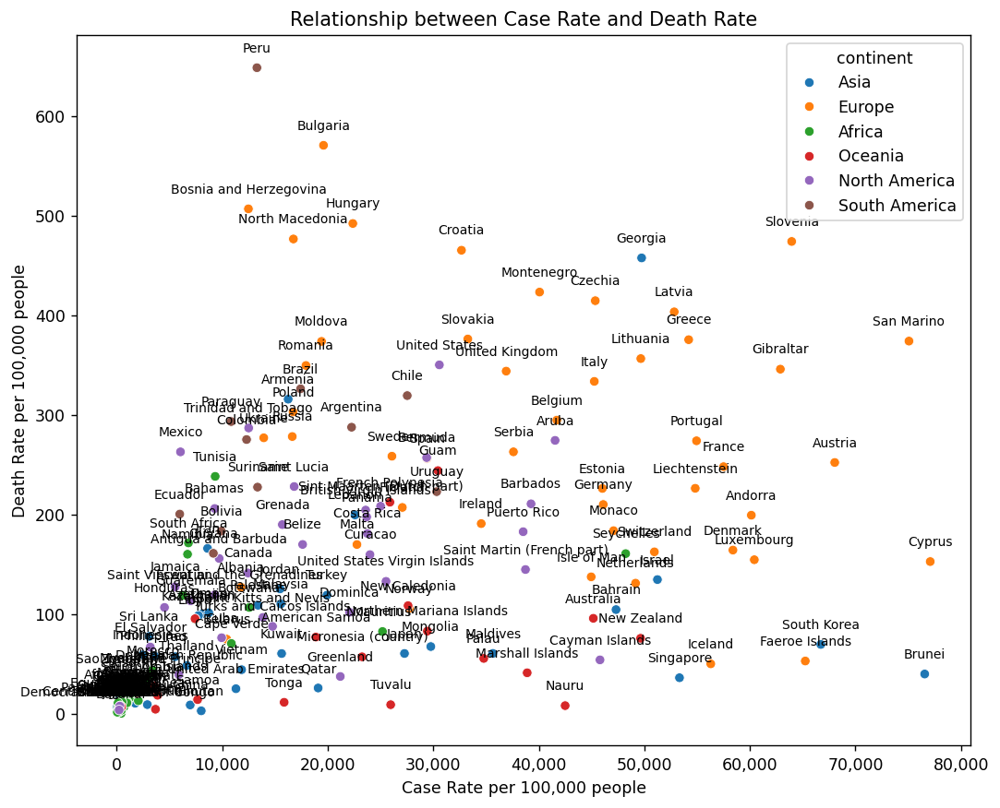

In [46]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="Case Rate", y="Death Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['Case Rate'], row['Death Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('Case Rate per 100,000 people')
plt.ylabel('Death Rate per 100,000 people')
plt.title('Relationship between Case Rate and Death Rate')

plt.show()

## Death Rate and relationships

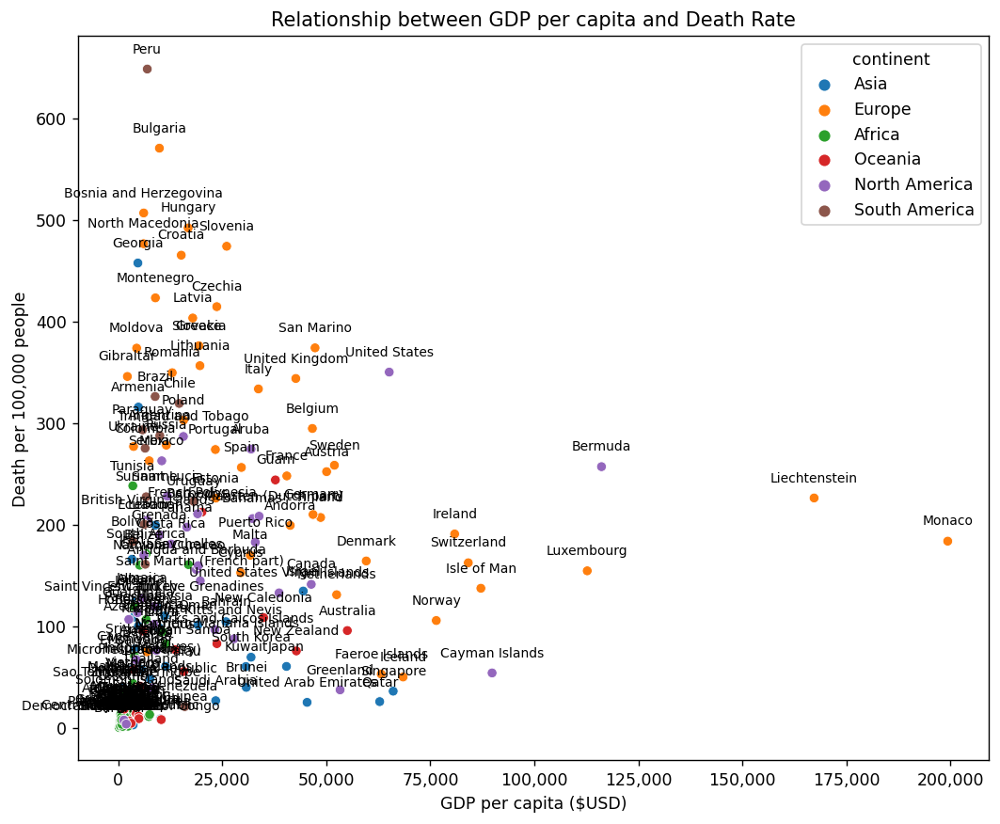

In [89]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="GDP per capita", y="Death Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['GDP per capita'], row['Death Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('GDP per capita ($USD)')
plt.ylabel('Death per 100,000 people')
plt.title('Relationship between GDP per capita and Death Rate')

plt.show()

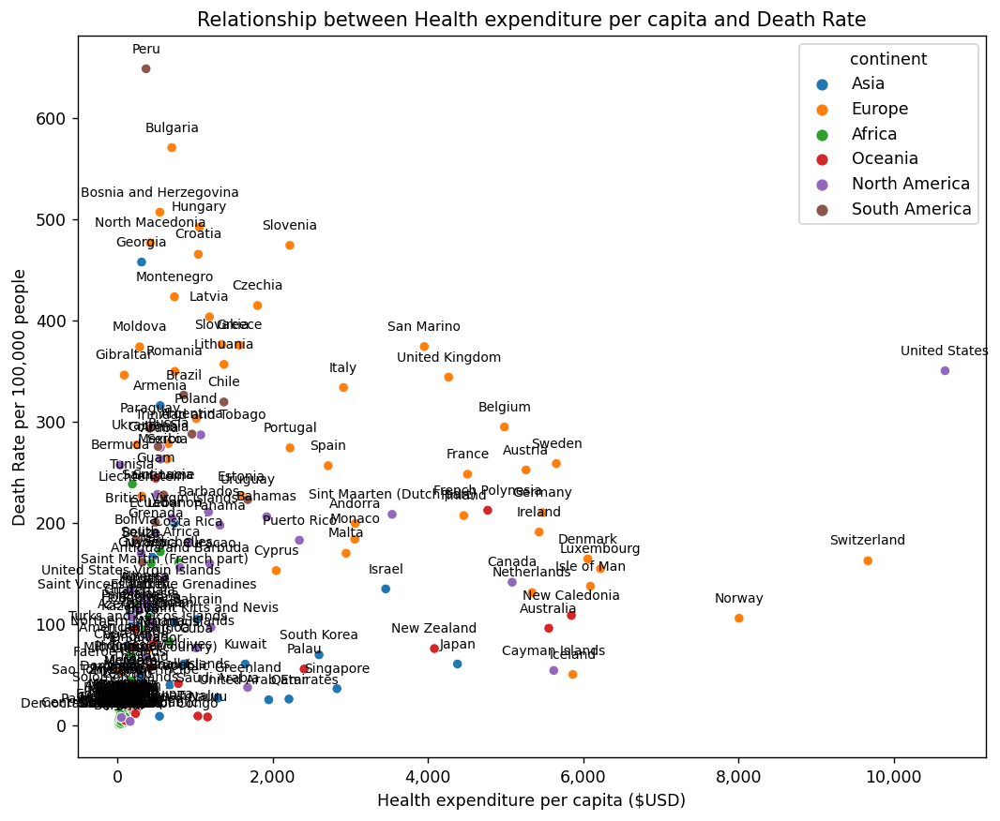

In [90]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="Health expenditure per capita", y="Death Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['Health expenditure per capita'], row['Death Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('Health expenditure per capita ($USD)')
plt.ylabel('Death Rate per 100,000 people')
plt.title('Relationship between Health expenditure per capita and Death Rate')

plt.show()

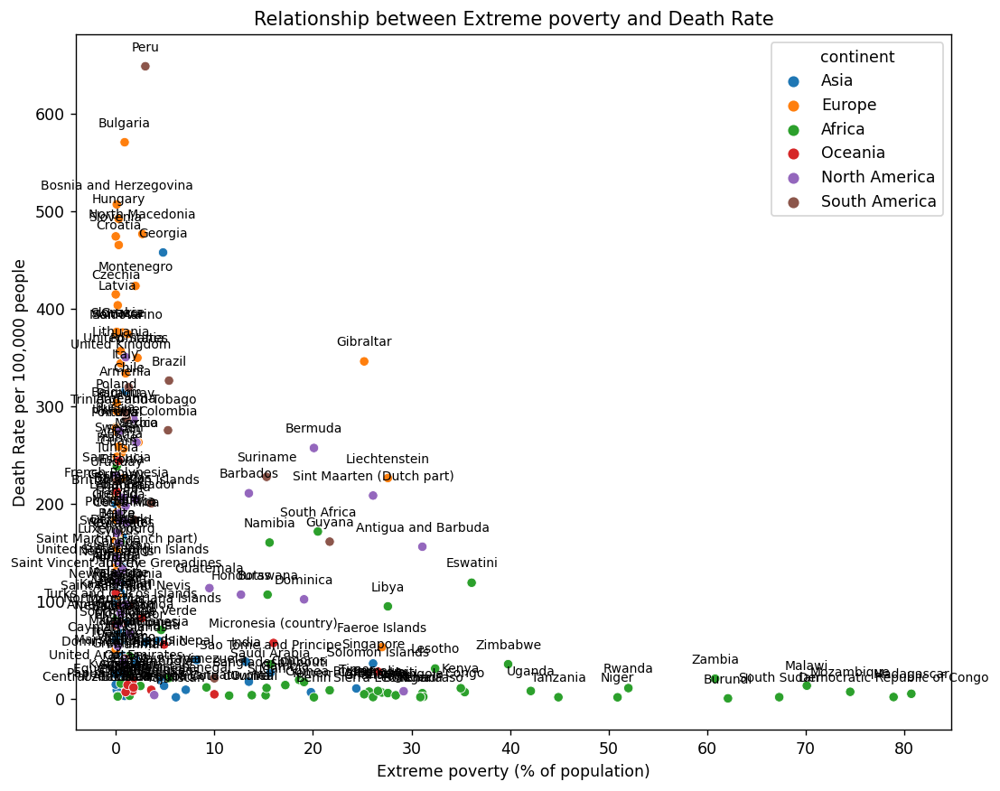

In [91]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="Extreme poverty", y="Death Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['Extreme poverty'], row['Death Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('Extreme poverty (% of population)')
plt.ylabel('Death Rate per 100,000 people')
plt.title('Relationship between Extreme poverty and Death Rate')

plt.show()

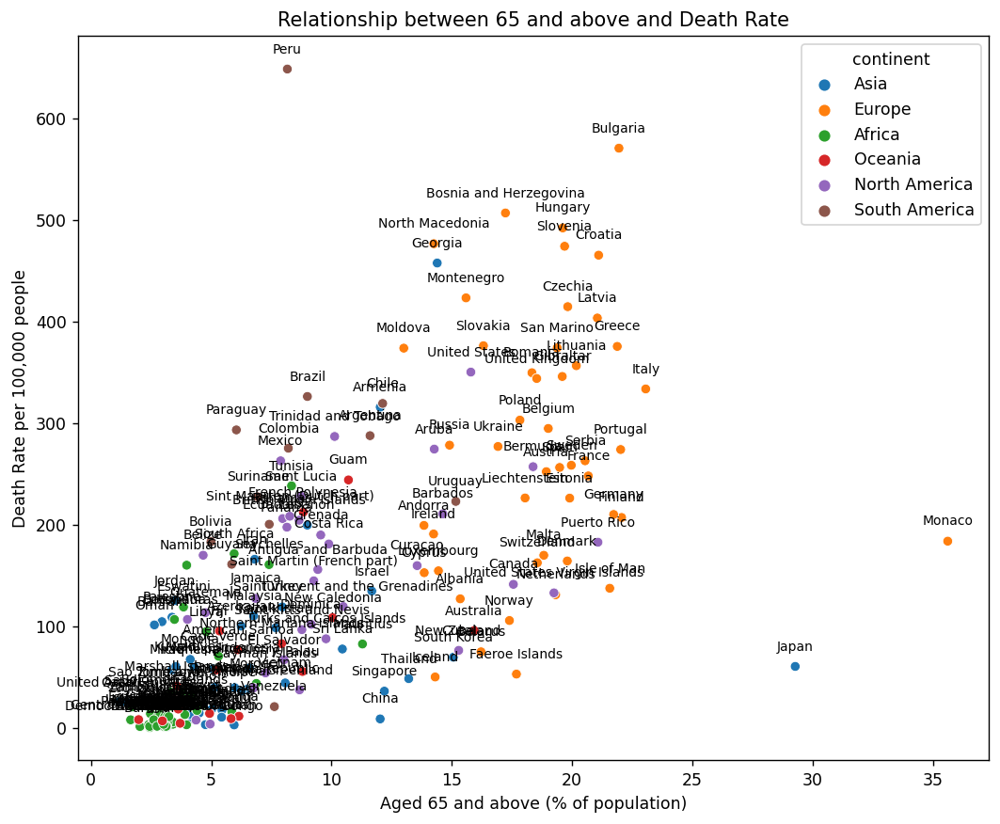

In [92]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="Population aged 65 and above", y="Death Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['Population aged 65 and above'], row['Death Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('Aged 65 and above (% of population)')
plt.ylabel('Death Rate per 100,000 people')
plt.title('Relationship between 65 and above and Death Rate')

plt.show()

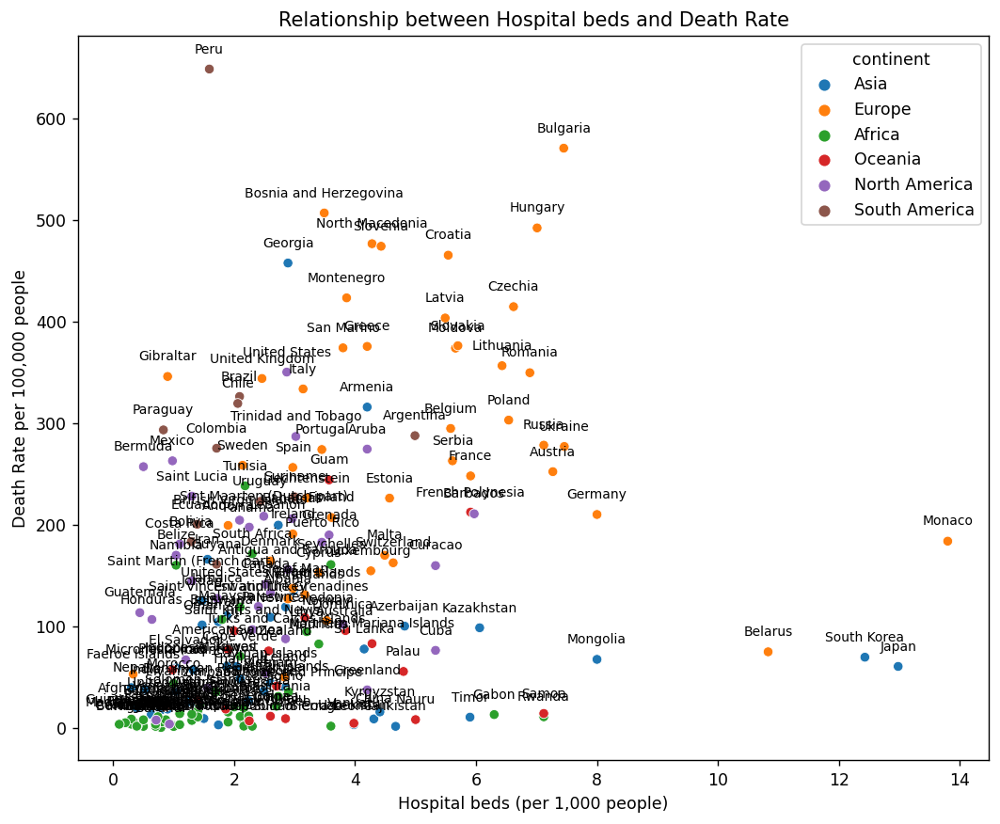

In [93]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="Hospital beds", y="Death Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['Hospital beds'], row['Death Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('Hospital beds (per 1,000 people)')
plt.ylabel('Death Rate per 100,000 people')
plt.title('Relationship between Hospital beds and Death Rate')

plt.show()

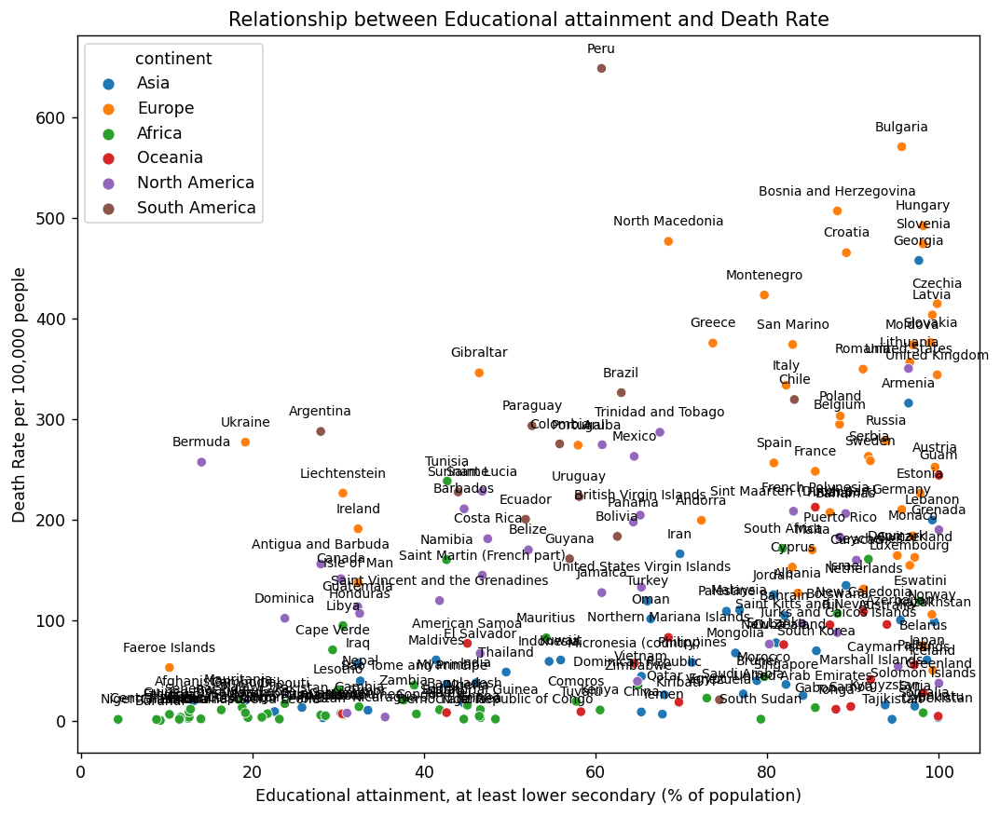

In [94]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="Lower secondary", y="Death Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['Lower secondary'], row['Death Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('Educational attainment, at least lower secondary (% of population)')
plt.ylabel('Death Rate per 100,000 people')
plt.title('Relationship between Educational attainment and Death Rate')

plt.show()

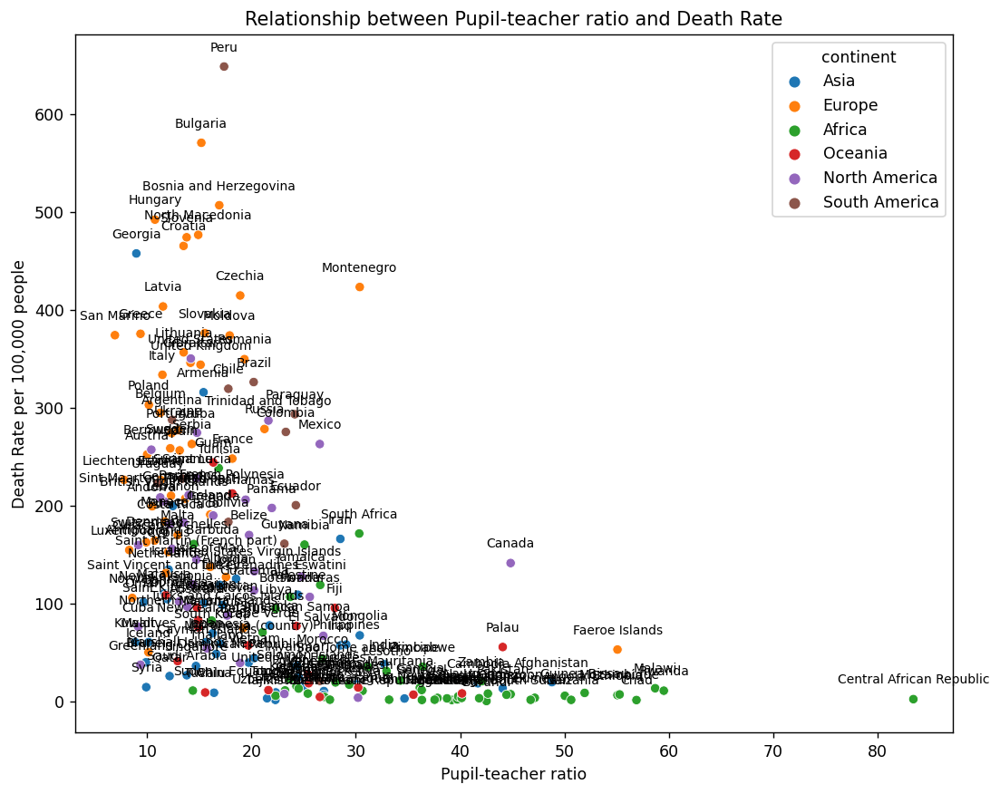

In [95]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="Pupil-teacher ratio", y="Death Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['Pupil-teacher ratio'], row['Death Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('Pupil-teacher ratio')
plt.ylabel('Death Rate per 100,000 people')
plt.title('Relationship between Pupil-teacher ratio and Death Rate')

plt.show()

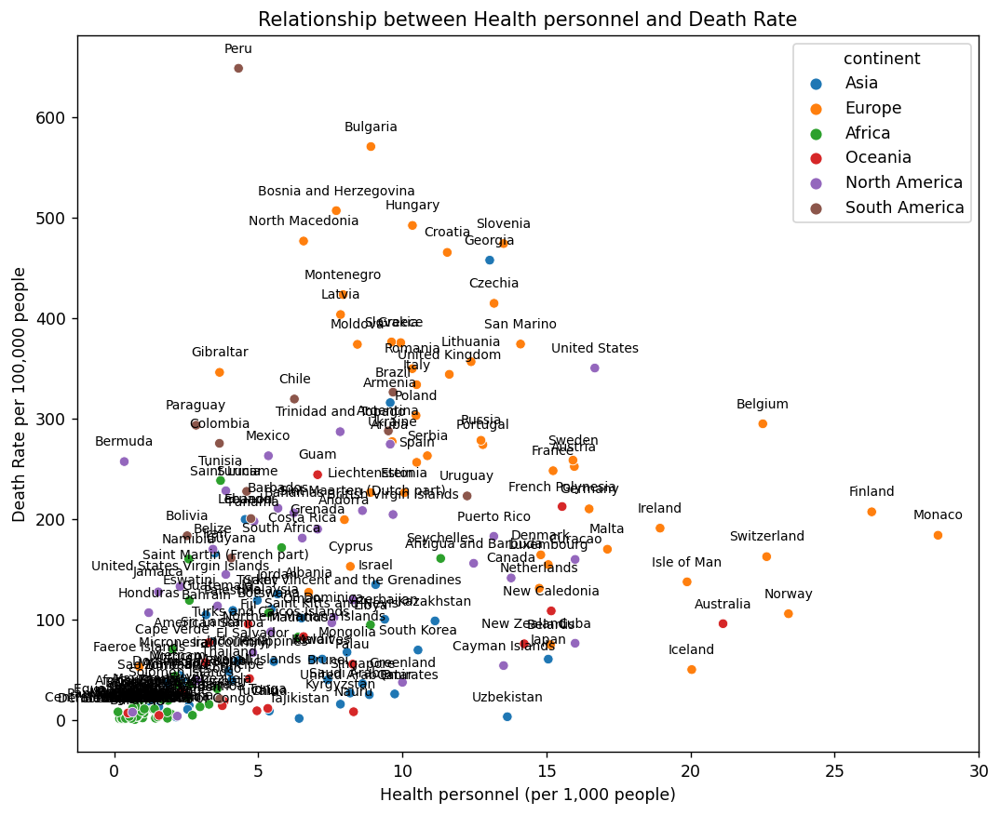

In [96]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="Health personnel", y="Death Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['Health personnel'], row['Death Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('Health personnel (per 1,000 people)')
plt.ylabel('Death Rate per 100,000 people')
plt.title('Relationship between Health personnel and Death Rate')

plt.show()

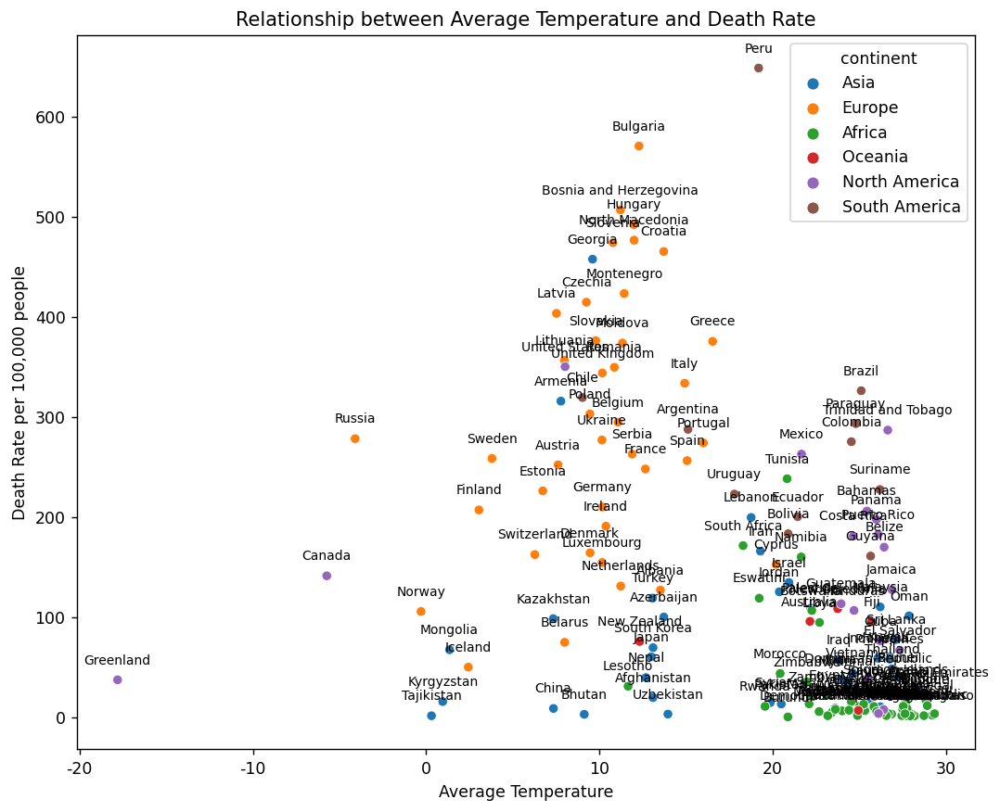

In [97]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="temperature", y="Death Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['temperature'], row['Death Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('Average Temperature')
plt.ylabel('Death Rate per 100,000 people')
plt.title('Relationship between Average Temperature and Death Rate')

plt.show()

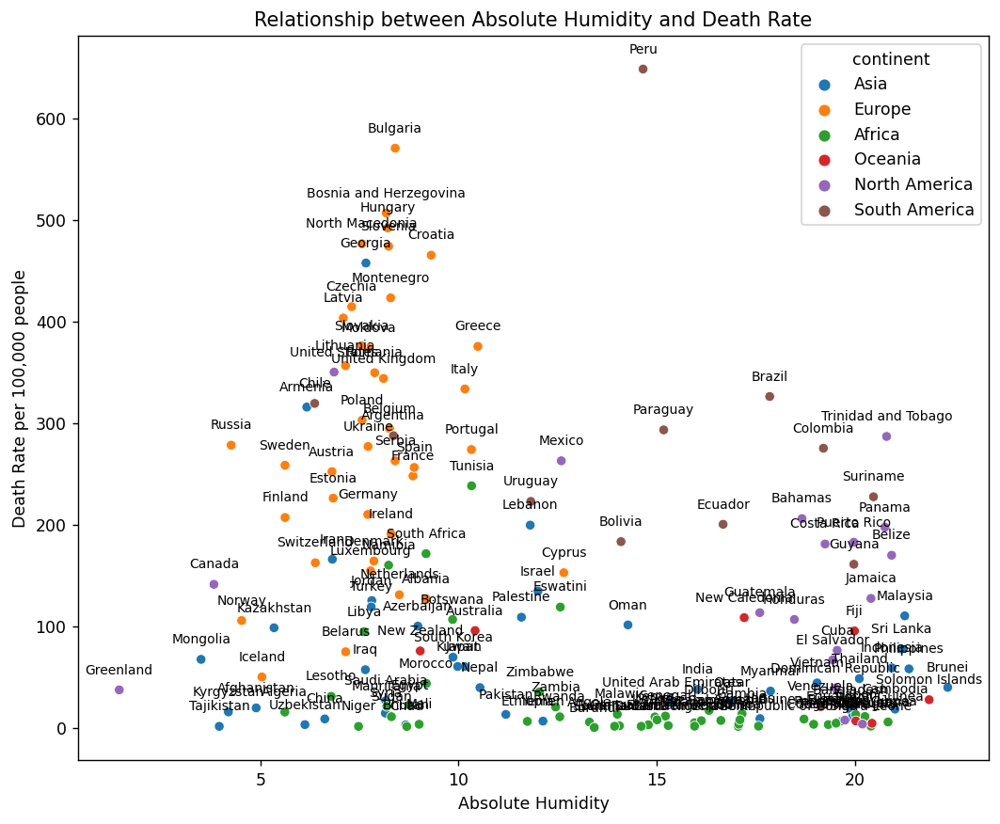

In [98]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="absolute_humidity", y="Death Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['absolute_humidity'], row['Death Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('Absolute Humidity')
plt.ylabel('Death Rate per 100,000 people')
plt.title('Relationship between Absolute Humidity and Death Rate')

plt.show()

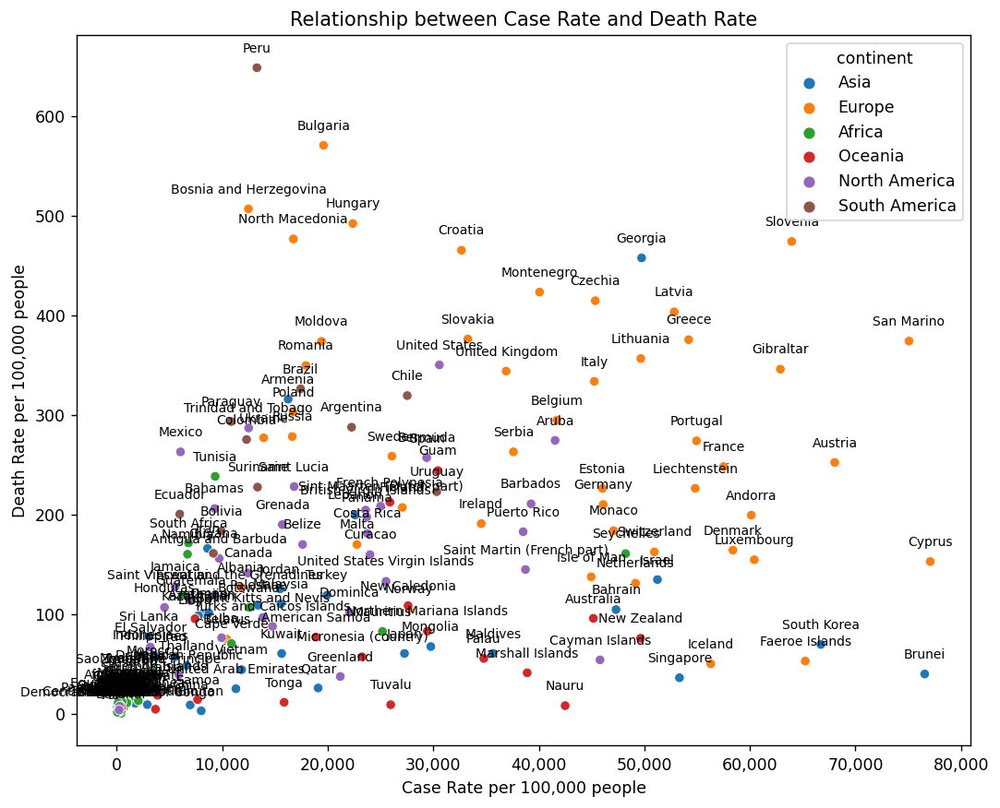

In [99]:
import matplotlib.ticker as ticker
plt.figure(figsize=(10, 8), dpi=125)
sns.scatterplot(data=corrvars, x="Case Rate", y="Death Rate", hue='continent')

# Add labels to some specific data points
for index, row in corrvars.iterrows():
    plt.annotate(row['country'], (row['Case Rate'], row['Death Rate']), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

# Formatting x-axis and y-axis
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}')) 
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))  

plt.xlabel('Case Rate per 100,000 people')
plt.ylabel('Death Rate per 100,000 people')
plt.title('Relationship between Case Rate and Death Rate')

plt.show()

# Correlations lags